<a href="https://colab.research.google.com/github/omidatashani/TopologicalAnalysis/blob/main/Gamma-IMF-Projection/PhasicTonicIMF1_Projection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install emd

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
!pip install neurodsp

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
!pip install yasa

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
!pip install pynapple

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
## Initialzing and loading required libraries and subfunctions
import matplotlib.pyplot as plt
import copy
import numpy as np
import yasa
from mne.filter import resample
import pynapple as nap
import seaborn as sns
import pandas as pd
from sklearn.preprocessing import normalize
import requests
from io import BytesIO

import scipy
from scipy import signal
from scipy.interpolate import griddata
from scipy.signal import correlate
from scipy.stats import pearsonr
from scipy.fft import fft
from scipy.spatial.distance import euclidean
from scipy.signal import spectrogram
from scipy.io import loadmat
import scipy.fft
import scipy.stats
import scipy.io as sio
from scipy.signal import hilbert

import emd as emd
import emd.sift as sift
import emd.spectra as spectra

from neurodsp.sim import sim_combined
from neurodsp.plts import plot_time_series, plot_timefrequency
from neurodsp.utils import create_times
from neurodsp.timefrequency.wavelets import compute_wavelet_transform
from neurodsp.filt import filter_signal

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
from google.colab import drive
drive.mount('/content/drive/')

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


In [ ]:
phasic = np.load('/content/drive/My Drive/sleep_slope/phasic_epochsIMF1to5.npz', allow_pickle=True)
tonic = np.load('/content/drive/My Drive/sleep_slope/tonic_epochsIMF1to5.npz', allow_pickle=True)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
phasic_theta_imf = phasic['arr_0'].item()['imf']
phasic_if = phasic['arr_0'].item()['IF_imf1']

tonic_theta_imf = tonic['arr_0'].item()['imf']
tonic_if = tonic['arr_0'].item()['IF_imf1']

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
phasic_theta_imf[0].shape

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



(3050,)

In [ ]:
phasic_if[0].shape

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



(3050,)

In [ ]:
fs = 2500

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
pip install scikit-tda

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
import scipy.io
import requests
from io import BytesIO
import numpy as np
from scipy import signal
from scipy.signal import savgol_filter
from scipy.stats import zscore
import matplotlib.pyplot as plt

! python -m pip install -U giotto-tda


from gtda.plotting import plot_point_cloud

def findIntervalsA(booString):
    """
    This function takes a boolean string and returns the start and end indices of consecutive True values.

    Parameters:
        booString (numpy array) : A boolean numpy array where True values indicate the presence of a condition.

    Returns:
        numpy array : A 2D numpy array where each row represents an interval of consecutive True values in the input.
        The first column is the start index and the second column is the end index of the interval.

    Note:
    The function assumes that the input is a 1D boolean numpy array. If the input does not meet this assumption, the function may not work as expected.
    """
    booString = booString.reshape((1, len(booString)))

    starts = np.where(np.diff((np.concatenate(([False], booString[0]), axis=0)).astype(int)) > 0)[0]
    ends = np.where(np.diff((np.concatenate((booString[0], [False]), axis=0)).astype(int))< 0)[0]

    intervals = np.vstack((starts, ends)).T
    return intervals

def ConsolidateIntervalsFast(intervals, strict='off', epsilon=0):
    """
    Merge together the intervals that are overlapping.

    Parameters:
        intervals (list of tuples): List of intervals (e.g., [(start1, end1), (start2, end2), ...]).
        strict (str, optional): Intervals with common bounds are consolidated ('off') or kept separate ('on').
            Default is 'off'.
        epsilon (float, optional): Intervals with close enough bounds (distance lesser than epsilon) are also
            consolidated. Default is 0.

    Returns:
        list of tuples: Consolidated intervals.
        list of int: For each original interval, the index of the consolidated
            interval to which it belongs (empty intervals yield NaN).

    Note:
        Assumes the intervals are sorted in time and that no interval is completely contained within another.
    """
    if len(intervals) == 0:
        raise ValueError("Input list of intervals cannot be empty.")

    # Get difference between two consecutive intervals
    vector = np.array(intervals).flatten()
    d = np.diff(vector)
    d = d[1::2]

    # Define problematic spots
    if strict == 'on':
        problematic = d < epsilon
    else:
        problematic = d <= epsilon
    # Leave function if intervals don't need consolidating
    if not np.any(problematic):
        consolidated = intervals
        return consolidated

    # Mark already consolidated intervals
    problematic_etendu = np.concatenate(([False], problematic, [False]))
    done = [intervals[i] for i in range(len(intervals)) if not problematic_etendu[i] and not problematic_etendu[i+1]]


    # Initialize consolidated intervals and target list
    indices = toIntervals(problematic)
    for i in range(len(indices)):
      indices[i] = (indices[i][0], indices[i][1] + 1)
    fixed= [ (x, y) for x, y in zip([intervals[int(i) - 1][0] for i, _ in indices], [intervals[int(i) - 1][1] for _, i in indices]) ]
    #fixed = [tuple([intervals[int(i) - 1][0] for i, _ in indices], [intervals[int(i) - 1][1] for _, i in indices])]
    # Concatenate done and fixed vertically
    if done != [] and fixed != []:
      consolidated = np.vstack((done, fixed))
    elif done == []:
       consolidated = [list(el) for el in fixed]
    else:
       consolidated = [list(el) for el in done]
    # Sort the rows of consolidated based on the first column
    consolidated = np.array(consolidated)

    # Sort the rows of consolidated based on the first column
    consolidated = consolidated[consolidated[:, 0].argsort()]
    consolidated = [tuple(row) for row in consolidated]
    target = [None] * len(intervals)
    # Initialize variables for the current interval
    current_start, current_end = intervals[0]
    current_target = 1

    # Convert target indices to 1-based indexing
    target = [t + 1 if t is not None else None for t in target]
    # Return the consolidated intervals
    return consolidated

def toIntervals(x, in_ = None):
    """
    Convert logical vector to a list of intervals.

    Parameters:
        x (list) : values, e.g. timestamps
        in_ (boolean list, optional) : boolean list of the same length as x;
    Returns:
        list : A list of tuples where each tuple represents an interval. Each tuple contains two elements: the start and end of the interval.

    Note:
    _in  can also be omitted, in which case x needs to be a boolean list
    and the intervals are defined in terms of indices in the logical vector.
    """
    if len(x) == 0:
        raise ValueError('Incorrect number of parameters .')

    if in_ is None:
        in_ = np.array(in_)
        in_ = x
        x = np.linspace(1, len(x) + 1, len(x) + 1)
    else:
        in_ = np.array(in_)
        if not np.all(np.isfinite(x)):
            raise ValueError('Incorrect x values.')

    if in_[-1] == 1:
        in_ = np.append(in_, 0)

    din = np.diff(np.concatenate(([0], in_)))
    start = np.where(din == 1)[0]
    stop = np.where(din == -1)[0]

    ivs = np.column_stack((start, stop - 1))
    if len(x) > 0:
        ivs = x[ivs]

    return ivs

def InIntervals(values, intervals):
    """
    Test which values fall in a list of sorted intervals.

    Parameters:
        values (list): Sorted list of values to test.
        intervals (list of tuples): Sorted list of (start, stop) pairs representing the intervals.

    Returns:
        list: Boolean values indicating whether each value is in an interval.
    """
    result = []
    interval_index = 0

    for value in values:
        while interval_index < len(intervals) and intervals[interval_index][1] < value:
            interval_index += 1

        if interval_index < len(intervals) and intervals[interval_index][0] <= value <= intervals[interval_index][1]:
            result.append(True)
        else:
            result.append(False)

    return result

def removeArtefacts(lfp_sig, originalFreq, amp_thresh, time_win_thresh):
    """
    Removes artefacts from the LFP signal.

    Parameters:
        lfp_sig (numpy.ndarray): The LFP signal.
        originalFreq (float): The sampling frequency.
        amp_thresh (tuple): The amplitude thresholds for detecting artefacts.
                            The first one corresponds to the threshold for the absolute value of the z-scored signal.
                            The second one corresponds to the threshold to the absolute difference between a value and its predecessor of the z-scored signal.
        time_win_thresh (tuple): The time windows that will be set to zero before and after the detected artefacts.
                                 The first one corresponds to the window for the absolute value of the z-scored signal.
                                 The second one corresponds to the window for the absolute difference between a value and its predecessor of the z-scored signal.
    Returns:
        numpy.ndarray: The corrected LFP signal.
        numpy.ndarray: The indices of the artefacts.
        numpy.ndarray: The corresponding time.

    Note :
        This function only set to zero the detected artefacts.
    """
    time = np.linspace(0, len(lfp_sig)/originalFreq, len(lfp_sig))
    lfp_sig = np.array(lfp_sig)
    # Parameters
    threshold1 = amp_thresh[0]  # in sigmas deviating from the mean
    aroundArtefact1 = time_win_thresh[0]  # 2, Big and long artefacts
    threshold2 = amp_thresh[1]  # for derivative of z-scored signal
    aroundArtefact2 = time_win_thresh[1]  # 0.1 Very fast fluctuations (short time scale)

    # Performing the computations
    timeValues = time
    sig_values = lfp_sig.copy()
    z_sig = (sig_values - np.mean(sig_values)) / np.std(sig_values)
    z_sig = np.ravel(z_sig)
    diff_sig = np.concatenate((np.diff(z_sig),[0]), axis=0)
    artefactInds = np.zeros(len(sig_values), dtype=bool)
    findIntervalsA(np.abs(z_sig)>threshold1)
    # First we detect the large global artefacts
    artefactInterval = timeValues[findIntervalsA(np.abs(z_sig)>threshold1)]
    #if np.size(artefactInterval) == 2:
      #artefactInterval = np.ravel(artefactInterval)
    if artefactInterval.size != 0:
      array_artefactInterval= [ (x, y) for x, y in zip(artefactInterval[:,0]-aroundArtefact1, artefactInterval[:,1]+aroundArtefact1) ]
      artefactInterval = ConsolidateIntervalsFast(array_artefactInterval);
      artefactInds = InIntervals(timeValues, artefactInterval)
    else:
      artefactInterval = np.zeros((0, 2))

    # Find noise using the derivative of the zscored signal (2)
    noisyInterval = timeValues[findIntervalsA(np.abs(diff_sig)>threshold2)]
    #if np.size(noisyInterval) == 2:
      #noisyInterval = np.ravel(noisyInterval)
    if noisyInterval.size != 0:
      array_noisyInterval= [ (x, y) for x, y in zip(noisyInterval[:,0]-aroundArtefact2, noisyInterval[:,1]+aroundArtefact2) ]
      noisyInterval = ConsolidateIntervalsFast(array_noisyInterval);
      artefactInds = np.logical_or(artefactInds, InIntervals(timeValues, noisyInterval))
    else:
      noisyInterval = np.zeros((0, 2))

    artefactInds = np.array(artefactInds)
    sig_values = np.ravel(sig_values)
    sig_values[artefactInds] = 0

    return sig_values, artefactInds, timeValues

def artefact_epochs(artefactsIndices, window_length, threshold = 0):
    """
    Get the indices of the epochs containing artefacts

    Parameters:
        artefactsIndices (list): the indices of the artefacts in the raw data.
        window_length (int) : the length of an epoch
        threshold (float, optional) : percentage of artefact necessary for an epoch to be detected as an artefact.

    Returns:
        numpy.ndarray : the indices of the epochs containing a percetage of artefacts greater than the threshold.
    """
    artefactsCountEpochs = artefactsIndices[:len(artefactsIndices)//window_length * window_length].reshape(-1, window_length)
    artefactsCountEpochs = [np.count_nonzero(el) for el in artefactsCountEpochs]
    art_percentage_per_epoch = np.ravel([(el/(window_length))*100  for el in artefactsCountEpochs])

    arte_indices = []
    for i, el in enumerate(art_percentage_per_epoch):
        if el > threshold:
            arte_indices.append(i)
    arte_indices = np.ravel(arte_indices)
    return arte_indices

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
amp_thresh = [9,8]
time_win_thresh = [0.2,0.1]
data_HPC, artefactInds, timeValues = removeArtefacts(phasic_theta_imf[5], fs, amp_thresh, time_win_thresh)
data_HPC = zscore(data_HPC)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
from scipy.signal import decimate
from scipy.signal import filtfilt

signal = np.array(data_HPC).flatten()

downsampling_factor = 5  # To reduce from 2500 Hz to 500 Hz
downsampled_signal = decimate(signal, downsampling_factor, ftype='fir')

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
raw_signal = downsampled_signal

# Min-max normalization to [-1, 1]
min_val = np.min(raw_signal)
max_val = np.max(raw_signal)
raw_signal = 2 * (raw_signal - min_val) / (max_val - min_val) - 1

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
from gtda.time_series import SingleTakensEmbedding

max_embedding_dimension = 10
max_time_delay = 20
stride = 3

embedder_nonperiodic_phasic = SingleTakensEmbedding(
    parameters_type="search",
    n_jobs=-1,
    time_delay=max_time_delay,
    dimension=max_embedding_dimension,
    stride=stride,
)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
def fit_embedder(embedder: SingleTakensEmbedding, y: np.ndarray, verbose: bool=True) -> np.ndarray:
    """Fits a Takens embedder and displays optimal search parameters."""
    y_embedded = embedder.fit_transform(y)

    if verbose:
        print(f"Shape of embedded time series: {y_embedded.shape}")
        print(
           f"Optimal embedding dimension is {embedder.dimension_} and time delay is {embedder.time_delay_}"
        )

    return y_embedded

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



# Phasic 0

In [ ]:
segment_length = int(0.94 * 500)

signal_length = len(raw_signal)

if signal_length > segment_length:
    num_segments = signal_length // segment_length
    trimmed_signal = raw_signal[:num_segments * segment_length]

    signal_segments = np.split(trimmed_signal, num_segments)
    signal_segments = np.array(signal_segments)
else:
    signal_segments = raw_signal

if signal_segments.shape[0] == 1:
    signal_segments = signal_segments.squeeze()

print(signal_segments.shape)

(3, 470)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
def split_signal(raw_signal, segment_duration=0.94, fs=500):
    """
    Splits the input signal into chunks of segment_duration (in seconds) based on the sampling frequency.

    Parameters:
    raw_signal (np.array): The input signal to split.
    segment_duration (float): Duration of each segment in seconds. Default is 0.94 seconds.
    fs (int): Sampling frequency in Hz. Default is 500 Hz.

    Returns:
    np.array: The signal split into chunks of size (segment_duration * fs).
              If the signal is shorter than or equal to one segment, it returns a 1D array.
    """
    # Calculate segment length in samples
    segment_length = int(segment_duration * fs)
    signal_length = len(raw_signal)

    # If the signal is longer than one segment
    if signal_length > segment_length:
        num_segments = signal_length // segment_length
        trimmed_signal = raw_signal[:num_segments * segment_length]
        signal_segments = np.split(trimmed_signal, num_segments)
        signal_segments = np.array(signal_segments)
    else:
        signal_segments = raw_signal

    # Ensure that a single segment remains 1D
    if signal_segments.shape[0] == 1:
        signal_segments = signal_segments.squeeze()

    return signal_segments

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
signal_segments = split_signal(raw_signal)
print(signal_segments.shape)
signal = signal_segments[1,:].squeeze()
signal.shape

(3, 470)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



(470,)

In [ ]:
data_if = phasic_if[5]
data_if = np.array(data_if).flatten()
downsampled_if = decimate(data_if, downsampling_factor, ftype='fir')
signals_if = split_signal(downsampled_if)
signal_if = signals_if[1,:].squeeze()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
targetFs = 500

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
import plotly.graph_objs as gobj

def plot_point_cloud_with_features(point_cloud, feature_matrix=None, dimension=None, plotly_params=None,
                                   color_map="plasma", marker_size=4, xlim=None, ylim=None, zlim=None,
                                   color_min=None, color_max=None):
    """Plot the first 2 or 3 coordinates of a point cloud and color them based on a feature matrix or time.

    Parameters
    ----------
    point_cloud : ndarray of shape (n_samples, n_dimensions)
        Data points to be represented in a 2D or 3D scatter plot. Only the
        first 2 or 3 dimensions will be considered for plotting.

    feature_matrix : ndarray of shape (n_samples,) or None, optional
        Feature values used to color the points in the scatter plot. If None, the points will be colored based on their order (time).

    dimension : int or None, default: ``None``
        Sets the dimension of the resulting plot. If ``None``, the dimension
        will be chosen between 2 and 3 depending on the shape of `point_cloud`.

    plotly_params : dict or None, optional, default: ``None``
        Custom parameters to configure the plotly figure. Allowed keys are
        ``"trace"`` and ``"layout"``, and the corresponding values should be
        dictionaries containing keyword arguments as would be fed to the
        :meth:`update_traces` and :meth:`update_layout` methods of
        :class:`plotly.graph_objects.Figure`.

    color_map : str, optional, default: ``Viridis``
        The colormap to use for coloring the points. Can be any Plotly colormap string (e.g., "Cividis", "plasma", "Inferno").

    marker_size : int, optional, default: 6
        Size of the points in the scatter plot.

    xlim : tuple or None, optional, default: None
        Limits for the x-axis in the form (xmin, xmax). If None, limits are determined automatically.

    ylim : tuple or None, optional, default: None
        Limits for the y-axis in the form (ymin, ymax). If None, limits are determined automatically.

    zlim : tuple or None, optional, default: None
        Limits for the z-axis in the form (zmin, zmax). Only used for 3D plots. If None, limits are determined automatically.

    color_min : float or None, optional
        Minimum value for the color scale. If None, it's set to the minimum of the feature matrix.

    color_max : float or None, optional
        Maximum value for the color scale. If None, it's set to the maximum of the feature matrix.

    Returns
    -------
    fig : :class:`plotly.graph_objects.Figure` object
        Figure representing a point cloud in 2D or 3D with coloring based on the feature matrix or time.

    """
    # Set default dimension based on point_cloud shape
    if dimension is None:
        dimension = min(3, point_cloud.shape[1])

    # Check if the point cloud has enough dimensions for the requested plot
    if point_cloud.shape[1] < dimension:
        raise ValueError("Not enough dimensions available in the input point cloud.")

    # If no feature matrix is provided, color the points based on time (index)
    if feature_matrix is None:
        feature_matrix = np.arange(point_cloud.shape[0])

    # Set color scale limits
    color_min = color_min if color_min is not None else feature_matrix.min()
    color_max = color_max if color_max is not None else feature_matrix.max()

    if dimension == 2:
        fig = gobj.Figure()
        fig.add_trace(gobj.Scatter(
            x=point_cloud[:, 0],
            y=point_cloud[:, 1],
            mode="markers",
            marker=dict(
                size=marker_size,
                color=feature_matrix,
                colorscale=color_map,
                cmin=color_min,  # Apply custom or default color minimum
                cmax=color_max,  # Apply custom or default color maximum
                opacity=0.8,
                showscale=True
            )
        ))

        # Update x and y axis limits if provided
        if xlim is not None:
            fig.update_xaxes(range=xlim)
        if ylim is not None:
            fig.update_yaxes(range=ylim)

    elif dimension == 3:
        fig = gobj.Figure()
        fig.add_trace(gobj.Scatter3d(
            x=point_cloud[:, 0],
            y=point_cloud[:, 1],
            z=point_cloud[:, 2],
            mode="markers",
            marker=dict(
                size=marker_size,
                color=feature_matrix,
                colorscale=color_map,
                cmin=color_min,  # Apply custom or default color minimum
                cmax=color_max,  # Apply custom or default color maximum
                opacity=0.8,
                showscale=True
            )
        ))

        # Apply x, y, and z limits if provided
        fig.update_layout(scene=dict(
            xaxis=dict(range=xlim) if xlim else {},
            yaxis=dict(range=ylim) if ylim else {},
            zaxis=dict(range=zlim) if zlim else {}
        ))

    # Update trace and layout according to user input
    if plotly_params:
        fig.update_traces(plotly_params.get("trace", None))
        fig.update_layout(plotly_params.get("layout", None))

    return fig

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
def plot_2d_projections(point_cloud, feature_matrix=None, color_map="plasma", marker_size=20,
                        color_min=None, color_max=None):
    """
    Plot 2D projections of the point cloud with feature-based coloring in 3 subplots.
    The projections are PC1 vs. PC2, PC1 vs. PC3, and PC2 vs. PC3.

    Parameters
    ----------
    point_cloud : ndarray of shape (n_samples, 3)
        Data points to be represented in 2D projections. Should have at least 3 dimensions.

    feature_matrix : ndarray of shape (n_samples,) or None, optional
        Feature values used to color the points in the scatter plot. If None, the points will be colored based on their order (time).

    color_map : str, optional, default: "plasma"
        The colormap to use for coloring the points.

    marker_size : int, optional, default: 10
        Size of the points in the scatter plot.

    color_min : float or None, optional
        Minimum value for the color scale. If None, it's set to the minimum of the feature matrix.

    color_max : float or None, optional
        Maximum value for the color scale. If None, it's set to the maximum of the feature matrix.

    Returns
    -------
    fig : Matplotlib Figure object
    """
    # Ensure the point cloud has at least 3 dimensions
    if point_cloud.shape[1] < 3:
        raise ValueError("The input point_cloud must have at least 3 dimensions.")

    # Set color scale limits
    if feature_matrix is None:
        feature_matrix = np.arange(point_cloud.shape[0])  # Default to coloring by index if no feature matrix
    color_min = color_min if color_min is not None else feature_matrix.min()
    color_max = color_max if color_max is not None else feature_matrix.max()

    # Create a figure with 3 subplots using constrained layout
    fig, axes = plt.subplots(1, 3, figsize=(18, 6), constrained_layout=True)
    fig.suptitle("2D Projections of Point Cloud")

    # PC1 vs PC2
    scatter1 = axes[0].scatter(point_cloud[:, 0], point_cloud[:, 1],
                               c=feature_matrix, cmap=color_map, s=marker_size,
                               vmin=color_min, vmax=color_max)
    axes[0].set_xlabel("PC1")
    axes[0].set_ylabel("PC2")
    axes[0].set_title("PC1 vs PC2")

    # PC1 vs PC3
    scatter2 = axes[1].scatter(point_cloud[:, 0], point_cloud[:, 2],
                               c=feature_matrix, cmap=color_map, s=marker_size,
                               vmin=color_min, vmax=color_max)
    axes[1].set_xlabel("PC1")
    axes[1].set_ylabel("PC3")
    axes[1].set_title("PC1 vs PC3")

    # PC2 vs PC3
    scatter3 = axes[2].scatter(point_cloud[:, 1], point_cloud[:, 2],
                               c=feature_matrix, cmap=color_map, s=marker_size,
                               vmin=color_min, vmax=color_max)
    axes[2].set_xlabel("PC2")
    axes[2].set_ylabel("PC3")
    axes[2].set_title("PC2 vs PC3")

    # Add a colorbar next to the last subplot
    cbar = fig.colorbar(scatter3, ax=axes, location="right", shrink=0.7, aspect=30)
    cbar.set_label("Feature Value")

    plt.show()
    return fig

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



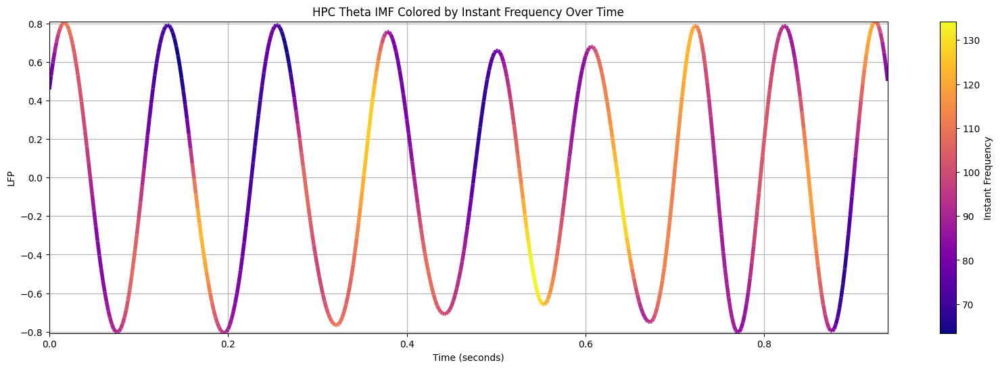

In [ ]:
from matplotlib.collections import LineCollection
from matplotlib.colors import ListedColormap, BoundaryNorm

time_seconds = np.arange(0, len(signal) * (1/targetFs), (1/targetFs))
plt.figure(figsize=(20, 6))
points = np.array([time_seconds, signal]).T.reshape(-1, 1, 2)
segments = np.concatenate([points[:-1], points[1:]], axis=1)
norm = plt.Normalize(signal_if.min(), signal_if.max())
cmap = plt.get_cmap('plasma')
lc = LineCollection(segments, cmap=cmap, norm=norm)
lc.set_array(signal_if)
lc.set_linewidth(4)
plt.gca().add_collection(lc)
plt.xlim(time_seconds.min(), time_seconds.max())
plt.ylim(signal.min(), signal.max())
plt.title('HPC Theta IMF Colored by Instant Frequency Over Time')
plt.xlabel('Time (seconds)')
plt.ylabel('LFP')
plt.grid(True)
cbar = plt.colorbar(lc)
cbar.set_label('Instant Frequency')

plt.show()

In [ ]:
def sliding_window_embedding_3d(signal):
    embedded = np.array([signal[i:i+3] for i in range(len(signal)-2)])
    return embedded

from sklearn.decomposition import PCA
y_nonperiodic_embedded = sliding_window_embedding_3d(signal)
pca = PCA(n_components=3)
y_nonperiodic_embedded_pca = pca.fit_transform(y_nonperiodic_embedded)
plot_point_cloud_with_features(y_nonperiodic_embedded_pca, feature_matrix=signal_if[:-2])

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



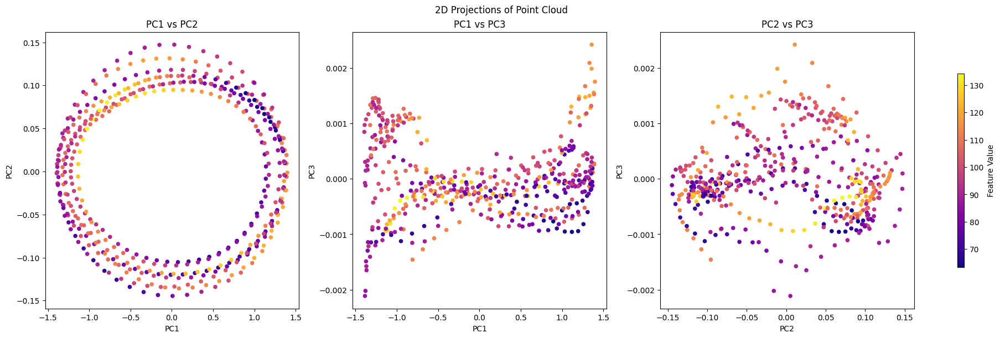

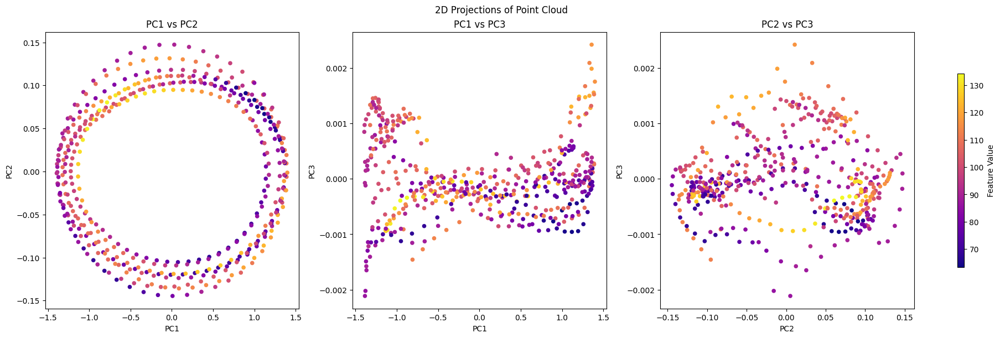

In [ ]:
plot_2d_projections(y_nonperiodic_embedded_pca, feature_matrix=signal_if[:-2])

In [ ]:
import ripser
import persim

def diagram_sizes(dgms):
    return ", ".join([f"|$H_{i}$|={len(d)}" for i, d in enumerate(dgms)])

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



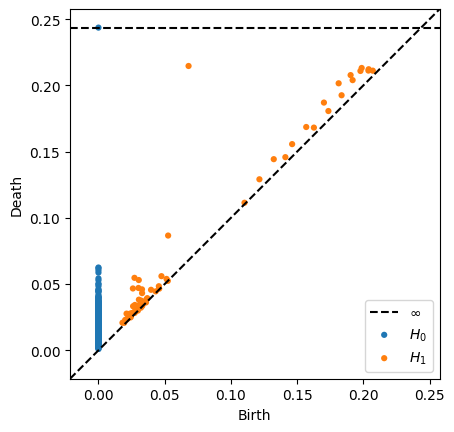

In [ ]:
dgm_p0 = ripser.ripser(y_nonperiodic_embedded)['dgms']
persim.plot_diagrams(
    dgm_p0,
    show=True
)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



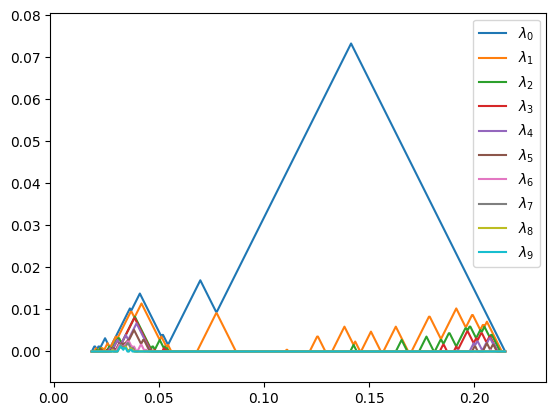

In [ ]:
from persim import PersLandscapeApprox, PersLandscapeExact
from persim.landscapes import plot_landscape_simple

pla = PersLandscapeApprox(dgms=dgm_p0,hom_deg=1)
ax = plot_landscape_simple(pla, depth_range=range(10))

In [ ]:
from sklearn.decomposition import PCA
pca2 = PCA(n_components=2)
y_nonperiodic_embedded_pca = pca2.fit_transform(y_nonperiodic_embedded)
y_nonperiodic_embeddedt = y_nonperiodic_embedded_pca[None, :, :]

from gtda.homology import VietorisRipsPersistence
# 0 - connected components, 1 - loops, 2 - voids
homology_dimensions = [0, 1]

nonperiodic_persistence = VietorisRipsPersistence(
    homology_dimensions=homology_dimensions, n_jobs=6
)
print("Persistence diagram for nonperiodic signal")
nonperiodic_persistence.fit_transform_plot(y_nonperiodic_embeddedt);

Persistence diagram for nonperiodic signal


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



# Phasic 1

In [ ]:
amp_thresh = [9,8]
time_win_thresh = [0.2,0.1]
data_HPC, artefactInds, timeValues = removeArtefacts(phasic_theta_imf[5], fs, amp_thresh, time_win_thresh)
data_HPC = zscore(data_HPC)

signal = np.array(data_HPC).flatten()
downsampled_signal = decimate(signal, downsampling_factor, ftype='fir')

raw_signal = downsampled_signal
min_val = np.min(raw_signal)
max_val = np.max(raw_signal)
raw_signal = 2 * (raw_signal - min_val) / (max_val - min_val) - 1

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
signal_segments = split_signal(raw_signal)
print(signal_segments.shape)
signal = signal_segments[2,:].squeeze()
signal.shape

(3, 470)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



(470,)

In [ ]:
data_if = phasic_if[5]
data_if = np.array(data_if).flatten()
downsampled_if = decimate(data_if, downsampling_factor, ftype='fir')
signals_if = split_signal(downsampled_if)
signal_if = signals_if[2,:].squeeze()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



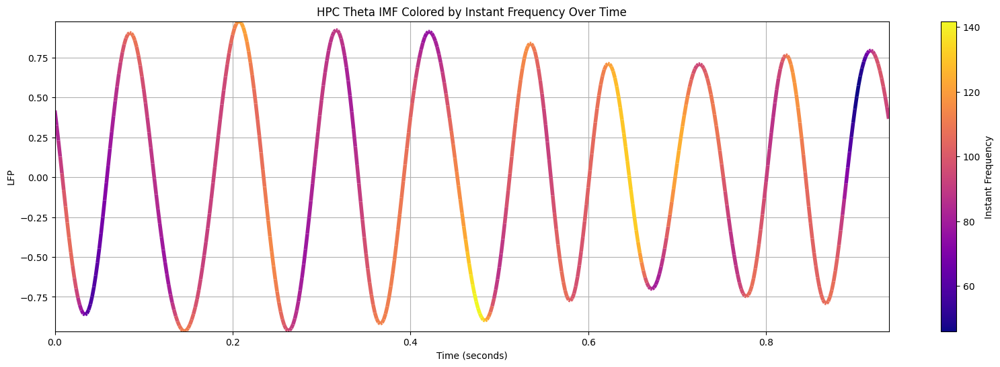

In [ ]:
time_seconds = np.arange(0, len(signal) * (1/targetFs), (1/targetFs))
plt.figure(figsize=(20, 6))
points = np.array([time_seconds, signal]).T.reshape(-1, 1, 2)
segments = np.concatenate([points[:-1], points[1:]], axis=1)
norm = plt.Normalize(signal_if.min(), signal_if.max())
cmap = plt.get_cmap('plasma')
lc = LineCollection(segments, cmap=cmap, norm=norm)
lc.set_array(signal_if)
lc.set_linewidth(4)
plt.gca().add_collection(lc)
plt.xlim(time_seconds.min(), time_seconds.max())
plt.ylim(signal.min(), signal.max())
plt.title('HPC Theta IMF Colored by Instant Frequency Over Time')
plt.xlabel('Time (seconds)')
plt.ylabel('LFP')
plt.grid(True)
cbar = plt.colorbar(lc)
cbar.set_label('Instant Frequency')

plt.show()

In [ ]:
y_nonperiodic_embedded = sliding_window_embedding_3d(signal)
pca = PCA(n_components=3)
y_nonperiodic_embedded_pca = pca.fit_transform(y_nonperiodic_embedded)
plot_point_cloud_with_features(y_nonperiodic_embedded_pca, feature_matrix=signal_if[:-2])

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



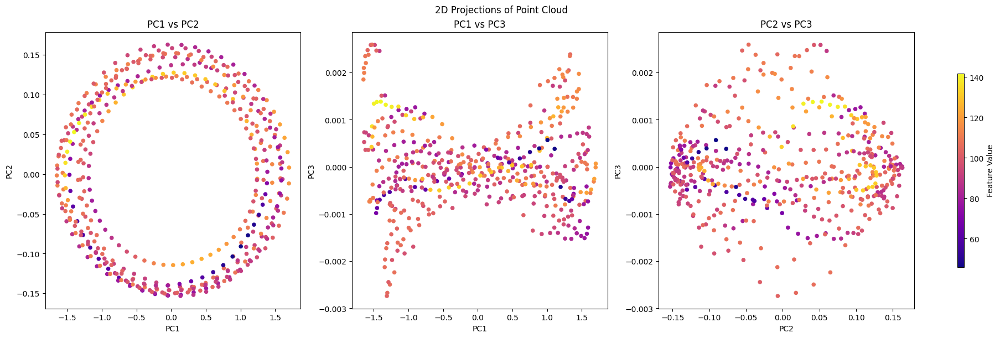

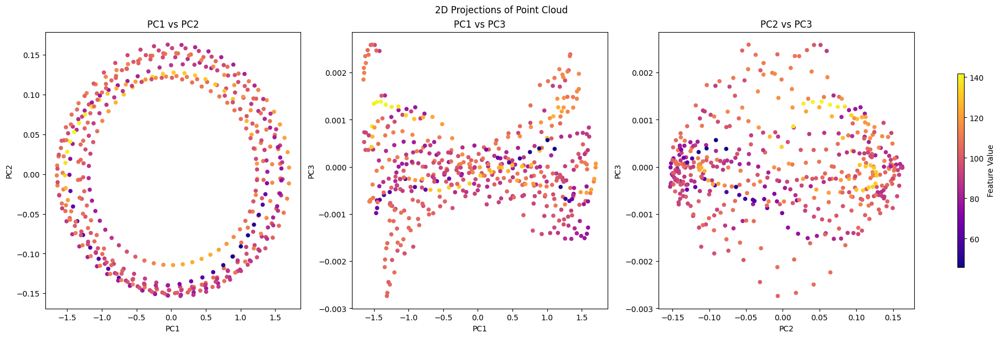

In [ ]:
plot_2d_projections(y_nonperiodic_embedded_pca, feature_matrix=signal_if[:-2])

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



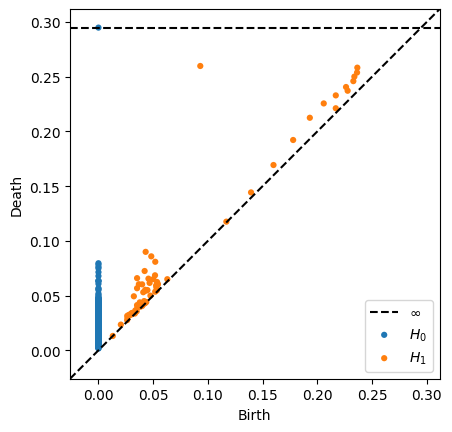

In [ ]:
dgm_p0 = ripser.ripser(y_nonperiodic_embedded)['dgms']
persim.plot_diagrams(
    dgm_p0,
    show=True
)

In [ ]:
pca2 = PCA(n_components=2)
y_nonperiodic_embedded_pca = pca2.fit_transform(y_nonperiodic_embedded)
y_nonperiodic_embeddedt = y_nonperiodic_embedded_pca[None, :, :]

from gtda.homology import VietorisRipsPersistence
# 0 - connected components, 1 - loops, 2 - voids
homology_dimensions = [0, 1]

nonperiodic_persistence = VietorisRipsPersistence(
    homology_dimensions=homology_dimensions, n_jobs=6
)
print("Persistence diagram for nonperiodic signal")
nonperiodic_persistence.fit_transform_plot(y_nonperiodic_embeddedt);

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



Persistence diagram for nonperiodic signal


# Phasic 2

In [ ]:
amp_thresh = [9,8]
time_win_thresh = [0.2,0.1]
data_HPC, artefactInds, timeValues = removeArtefacts(phasic_theta_imf[6], fs, amp_thresh, time_win_thresh)
data_HPC = zscore(data_HPC)

signal = np.array(data_HPC).flatten()
downsampled_signal = decimate(signal, downsampling_factor, ftype='fir')

raw_signal = downsampled_signal
min_val = np.min(raw_signal)
max_val = np.max(raw_signal)
raw_signal = 2 * (raw_signal - min_val) / (max_val - min_val) - 1

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
signal_segments = split_signal(raw_signal)
print(signal_segments.shape)
signal = signal_segments[0,:].squeeze()
signal.shape

(3, 470)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



(470,)

In [ ]:
data_if = phasic_if[6]
data_if = np.array(data_if).flatten()
downsampled_if = decimate(data_if, downsampling_factor, ftype='fir')
signals_if = split_signal(downsampled_if)
signal_if = signals_if[0,:].squeeze()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



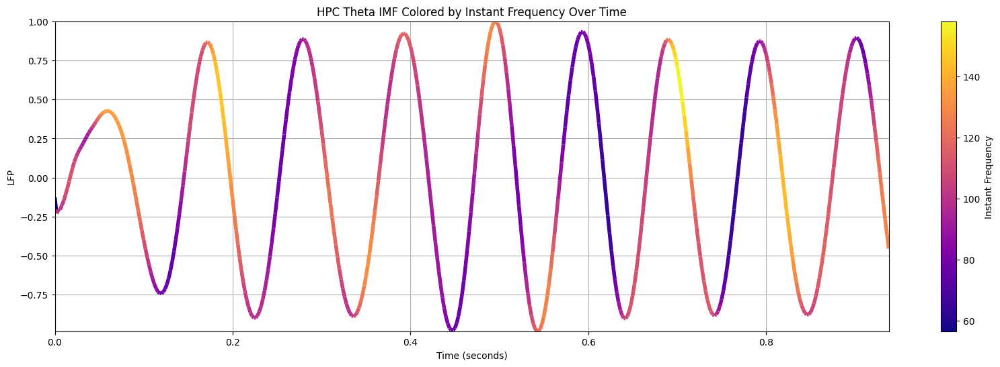

In [ ]:
time_seconds = np.arange(0, len(signal) * (1/targetFs), (1/targetFs))
plt.figure(figsize=(20, 6))
points = np.array([time_seconds, signal]).T.reshape(-1, 1, 2)
segments = np.concatenate([points[:-1], points[1:]], axis=1)
norm = plt.Normalize(signal_if.min(), signal_if.max())
cmap = plt.get_cmap('plasma')
lc = LineCollection(segments, cmap=cmap, norm=norm)
lc.set_array(signal_if)
lc.set_linewidth(4)
plt.gca().add_collection(lc)
plt.xlim(time_seconds.min(), time_seconds.max())
plt.ylim(signal.min(), signal.max())
plt.title('HPC Theta IMF Colored by Instant Frequency Over Time')
plt.xlabel('Time (seconds)')
plt.ylabel('LFP')
plt.grid(True)
cbar = plt.colorbar(lc)
cbar.set_label('Instant Frequency')

plt.show()

In [ ]:
y_nonperiodic_embedded = sliding_window_embedding_3d(signal)
pca = PCA(n_components=3)
y_nonperiodic_embedded_pca = pca.fit_transform(y_nonperiodic_embedded)
plot_point_cloud_with_features(y_nonperiodic_embedded_pca, feature_matrix=signal_if[:-2])

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



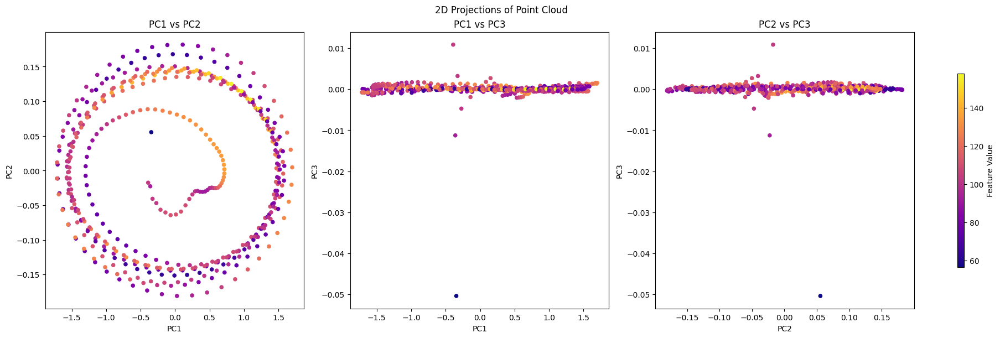

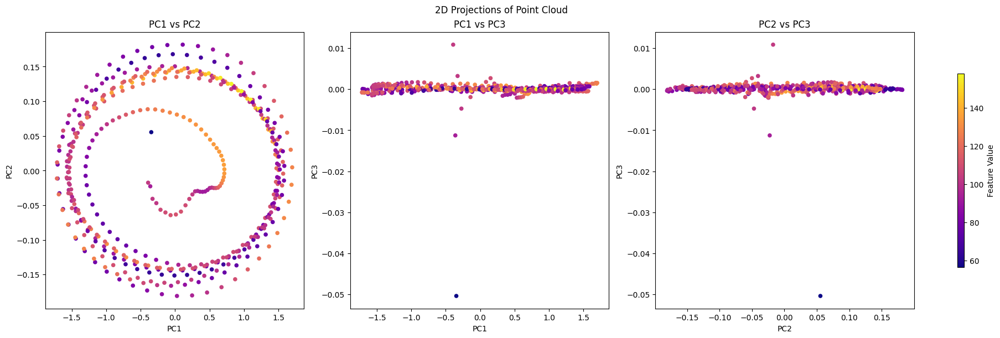

In [ ]:
plot_2d_projections(y_nonperiodic_embedded_pca, feature_matrix=signal_if[:-2])

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



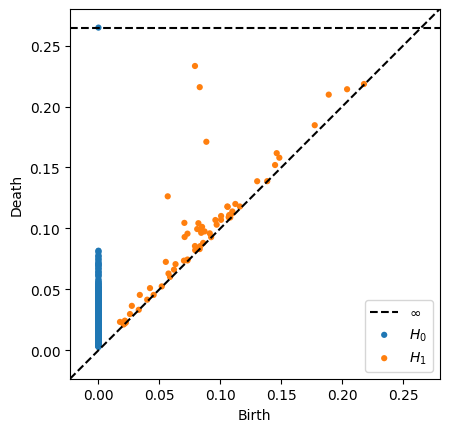

In [ ]:
dgm_p0 = ripser.ripser(y_nonperiodic_embedded)['dgms']
persim.plot_diagrams(
    dgm_p0,
    show=True
)

In [ ]:
pca2 = PCA(n_components=2)
y_nonperiodic_embedded_pca = pca2.fit_transform(y_nonperiodic_embedded)
y_nonperiodic_embeddedt = y_nonperiodic_embedded_pca[None, :, :]

from gtda.homology import VietorisRipsPersistence
# 0 - connected components, 1 - loops, 2 - voids
homology_dimensions = [0, 1]

nonperiodic_persistence = VietorisRipsPersistence(
    homology_dimensions=homology_dimensions, n_jobs=6
)
print("Persistence diagram for nonperiodic signal")
nonperiodic_persistence.fit_transform_plot(y_nonperiodic_embeddedt);

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



Persistence diagram for nonperiodic signal


# Phasic 3

In [ ]:
signal_segments = split_signal(raw_signal)
print(signal_segments.shape)
signal = signal_segments[1,:].squeeze()
signal.shape

(3, 470)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



(470,)

In [ ]:
data_if = phasic_if[6]
data_if = np.array(data_if).flatten()
downsampled_if = decimate(data_if, downsampling_factor, ftype='fir')
signals_if = split_signal(downsampled_if)
signal_if = signals_if[1,:].squeeze()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



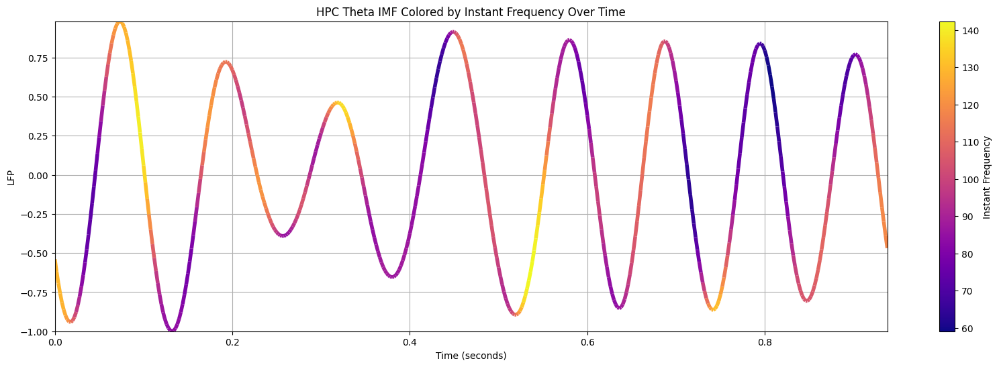

In [ ]:
time_seconds = np.arange(0, len(signal) * (1/targetFs), (1/targetFs))
plt.figure(figsize=(20, 6))
points = np.array([time_seconds, signal]).T.reshape(-1, 1, 2)
segments = np.concatenate([points[:-1], points[1:]], axis=1)
norm = plt.Normalize(signal_if.min(), signal_if.max())
cmap = plt.get_cmap('plasma')
lc = LineCollection(segments, cmap=cmap, norm=norm)
lc.set_array(signal_if)
lc.set_linewidth(4)
plt.gca().add_collection(lc)
plt.xlim(time_seconds.min(), time_seconds.max())
plt.ylim(signal.min(), signal.max())
plt.title('HPC Theta IMF Colored by Instant Frequency Over Time')
plt.xlabel('Time (seconds)')
plt.ylabel('LFP')
plt.grid(True)
cbar = plt.colorbar(lc)
cbar.set_label('Instant Frequency')

plt.show()

In [ ]:
y_nonperiodic_embedded = sliding_window_embedding_3d(signal)
pca = PCA(n_components=3)
y_nonperiodic_embedded_pca = pca.fit_transform(y_nonperiodic_embedded)
plot_point_cloud_with_features(y_nonperiodic_embedded_pca, feature_matrix=signal_if[:-2])

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



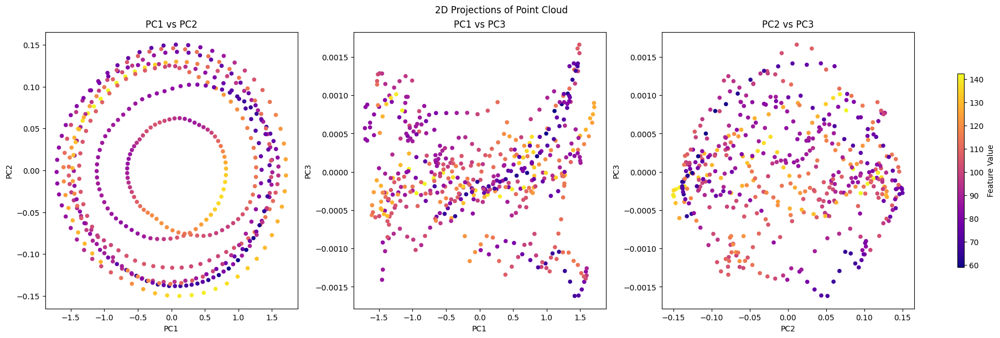

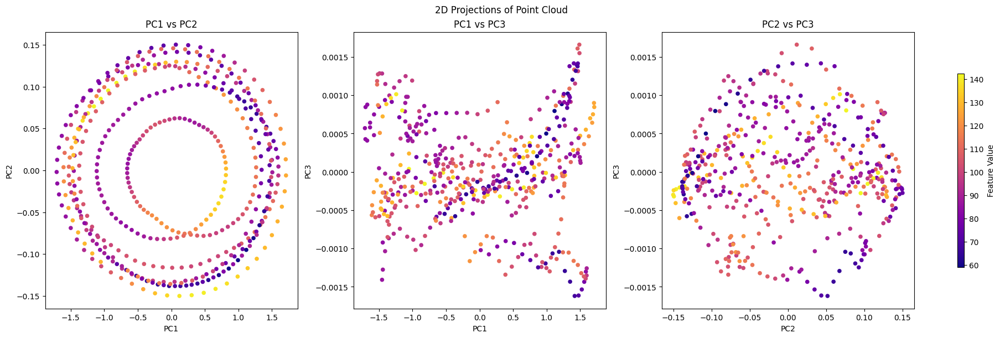

In [ ]:
plot_2d_projections(y_nonperiodic_embedded_pca, feature_matrix=signal_if[:-2])

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



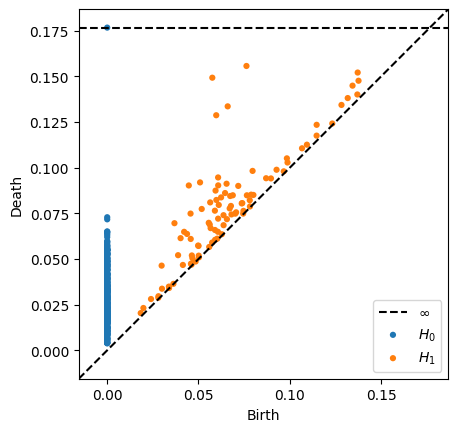

In [ ]:
dgm_p0 = ripser.ripser(y_nonperiodic_embedded)['dgms']
persim.plot_diagrams(
    dgm_p0,
    show=True
)

In [ ]:
pca2 = PCA(n_components=2)
y_nonperiodic_embedded_pca = pca2.fit_transform(y_nonperiodic_embedded)
y_nonperiodic_embeddedt = y_nonperiodic_embedded_pca[None, :, :]

from gtda.homology import VietorisRipsPersistence
# 0 - connected components, 1 - loops, 2 - voids
homology_dimensions = [0, 1]

nonperiodic_persistence = VietorisRipsPersistence(
    homology_dimensions=homology_dimensions, n_jobs=6
)
print("Persistence diagram for nonperiodic signal")
nonperiodic_persistence.fit_transform_plot(y_nonperiodic_embeddedt);

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



Persistence diagram for nonperiodic signal


# Phasic 4

In [ ]:
signal_segments = split_signal(raw_signal)
print(signal_segments.shape)
signal = signal_segments[2,:].squeeze()
signal.shape

(3, 470)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



(470,)

In [ ]:
data_if = phasic_if[6]
data_if = np.array(data_if).flatten()
downsampled_if = decimate(data_if, downsampling_factor, ftype='fir')
signals_if = split_signal(downsampled_if)
signal_if = signals_if[2,:].squeeze()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



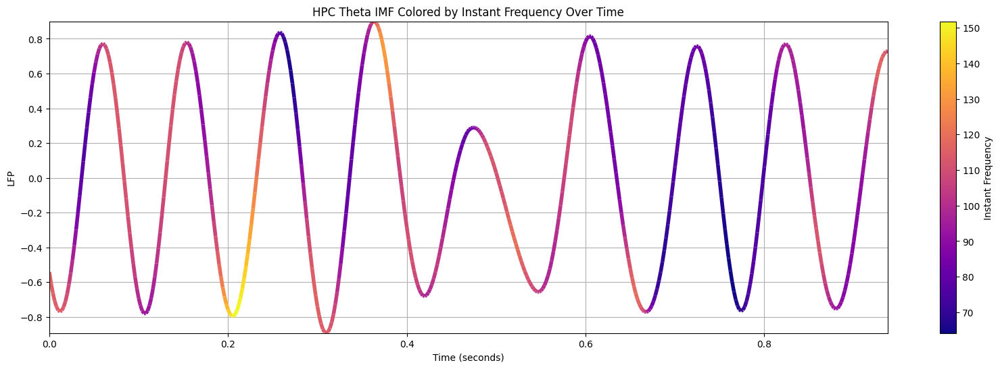

In [ ]:
time_seconds = np.arange(0, len(signal) * (1/targetFs), (1/targetFs))
plt.figure(figsize=(20, 6))
points = np.array([time_seconds, signal]).T.reshape(-1, 1, 2)
segments = np.concatenate([points[:-1], points[1:]], axis=1)
norm = plt.Normalize(signal_if.min(), signal_if.max())
cmap = plt.get_cmap('plasma')
lc = LineCollection(segments, cmap=cmap, norm=norm)
lc.set_array(signal_if)
lc.set_linewidth(4)
plt.gca().add_collection(lc)
plt.xlim(time_seconds.min(), time_seconds.max())
plt.ylim(signal.min(), signal.max())
plt.title('HPC Theta IMF Colored by Instant Frequency Over Time')
plt.xlabel('Time (seconds)')
plt.ylabel('LFP')
plt.grid(True)
cbar = plt.colorbar(lc)
cbar.set_label('Instant Frequency')

plt.show()

In [ ]:
y_nonperiodic_embedded = sliding_window_embedding_3d(signal)
pca = PCA(n_components=3)
y_nonperiodic_embedded_pca = pca.fit_transform(y_nonperiodic_embedded)
plot_point_cloud_with_features(y_nonperiodic_embedded_pca, feature_matrix=signal_if[:-2])

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



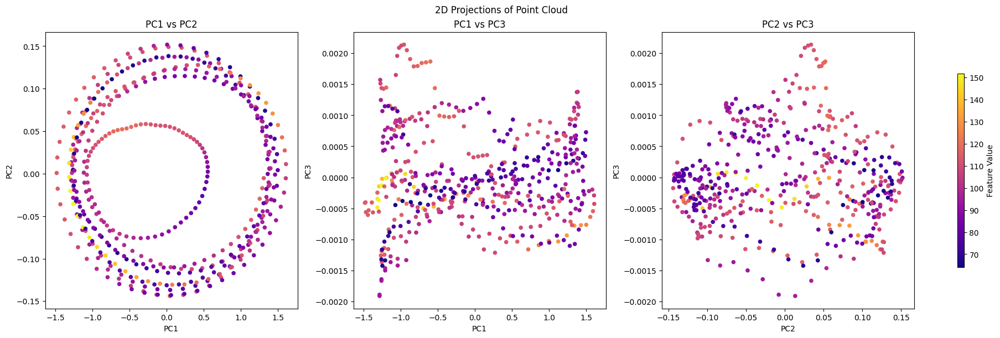

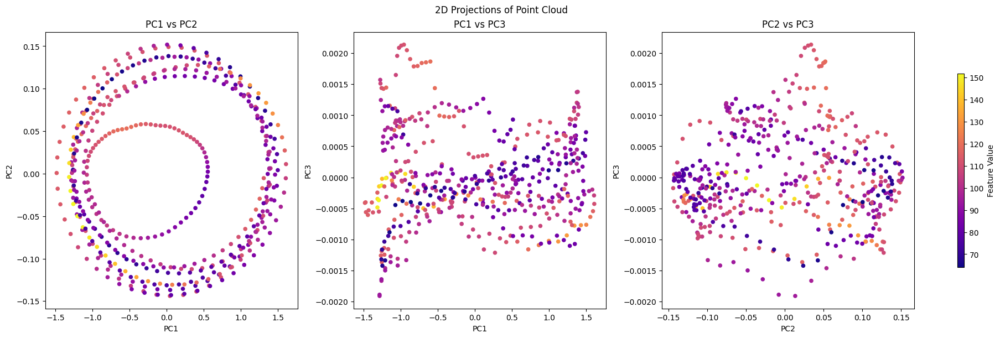

In [ ]:
plot_2d_projections(y_nonperiodic_embedded_pca, feature_matrix=signal_if[:-2])

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



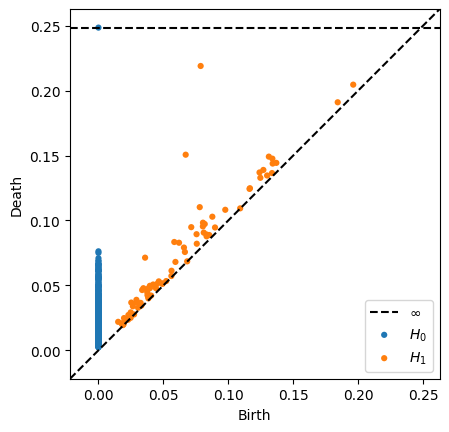

In [ ]:
dgm_p0 = ripser.ripser(y_nonperiodic_embedded)['dgms']
persim.plot_diagrams(
    dgm_p0,
    show=True
)

In [ ]:
pca2 = PCA(n_components=2)
y_nonperiodic_embedded_pca = pca2.fit_transform(y_nonperiodic_embedded)
y_nonperiodic_embeddedt = y_nonperiodic_embedded_pca[None, :, :]

from gtda.homology import VietorisRipsPersistence
# 0 - connected components, 1 - loops, 2 - voids
homology_dimensions = [0, 1]

nonperiodic_persistence = VietorisRipsPersistence(
    homology_dimensions=homology_dimensions, n_jobs=6
)
print("Persistence diagram for nonperiodic signal")
nonperiodic_persistence.fit_transform_plot(y_nonperiodic_embeddedt);

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



Persistence diagram for nonperiodic signal


# Phasic 5

In [ ]:
amp_thresh = [9,8]
time_win_thresh = [0.2,0.1]
data_HPC, artefactInds, timeValues = removeArtefacts(phasic_theta_imf[7], fs, amp_thresh, time_win_thresh)
data_HPC = zscore(data_HPC)

signal = np.array(data_HPC).flatten()
downsampled_signal = decimate(signal, downsampling_factor, ftype='fir')

raw_signal = downsampled_signal
min_val = np.min(raw_signal)
max_val = np.max(raw_signal)
raw_signal = 2 * (raw_signal - min_val) / (max_val - min_val) - 1

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
signal_segments = split_signal(raw_signal)
print(signal_segments.shape)
signal = signal_segments[0,:].squeeze()
signal.shape

(3, 470)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



(470,)

In [ ]:
data_if = phasic_if[7]
data_if = np.array(data_if).flatten()
downsampled_if = decimate(data_if, downsampling_factor, ftype='fir')
signals_if = split_signal(downsampled_if)
signal_if = signals_if[0,:].squeeze()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



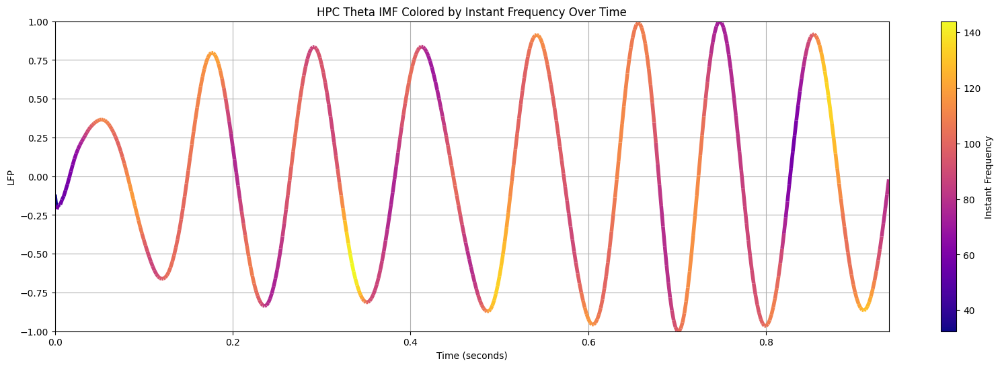

In [ ]:
time_seconds = np.arange(0, len(signal) * (1/targetFs), (1/targetFs))
plt.figure(figsize=(20, 6))
points = np.array([time_seconds, signal]).T.reshape(-1, 1, 2)
segments = np.concatenate([points[:-1], points[1:]], axis=1)
norm = plt.Normalize(signal_if.min(), signal_if.max())
cmap = plt.get_cmap('plasma')
lc = LineCollection(segments, cmap=cmap, norm=norm)
lc.set_array(signal_if)
lc.set_linewidth(4)
plt.gca().add_collection(lc)
plt.xlim(time_seconds.min(), time_seconds.max())
plt.ylim(signal.min(), signal.max())
plt.title('HPC Theta IMF Colored by Instant Frequency Over Time')
plt.xlabel('Time (seconds)')
plt.ylabel('LFP')
plt.grid(True)
cbar = plt.colorbar(lc)
cbar.set_label('Instant Frequency')

plt.show()

In [ ]:
y_nonperiodic_embedded = sliding_window_embedding_3d(signal)
pca = PCA(n_components=3)
y_nonperiodic_embedded_pca = pca.fit_transform(y_nonperiodic_embedded)
plot_point_cloud_with_features(y_nonperiodic_embedded_pca, feature_matrix=signal_if[:-2])

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



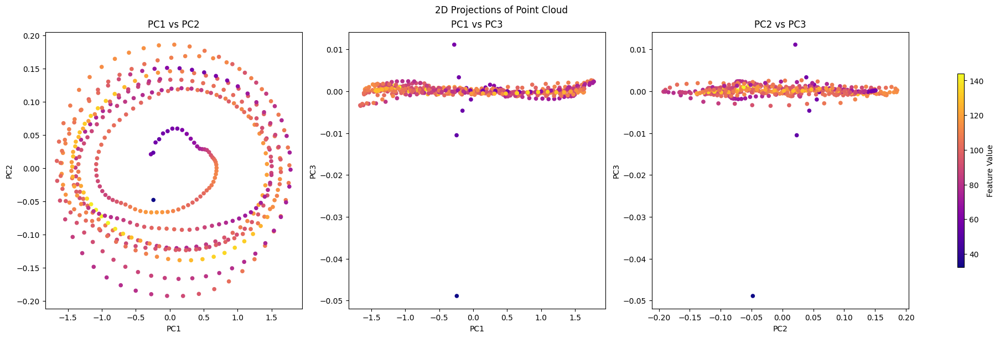

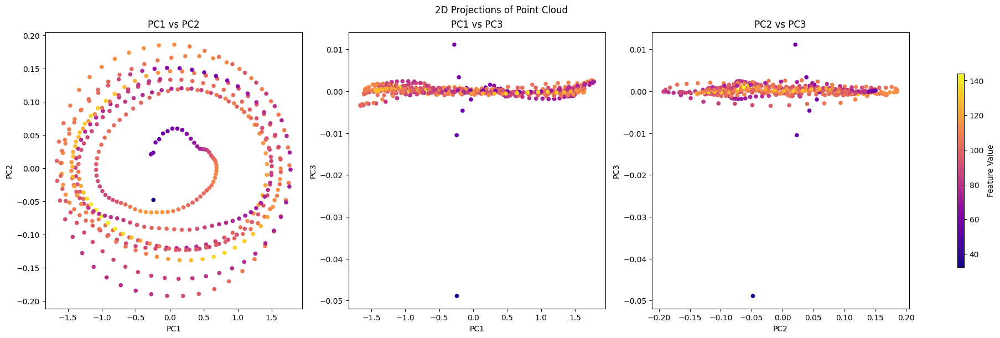

In [ ]:
plot_2d_projections(y_nonperiodic_embedded_pca, feature_matrix=signal_if[:-2])

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



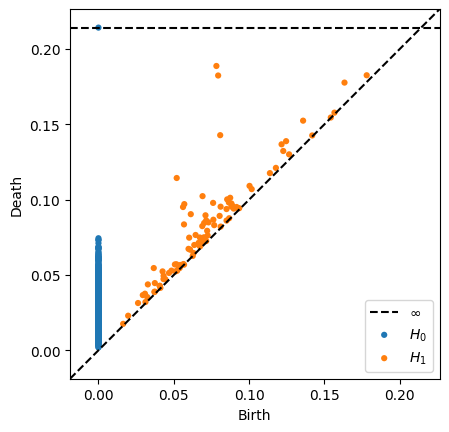

In [ ]:
dgm_p0 = ripser.ripser(y_nonperiodic_embedded)['dgms']
persim.plot_diagrams(
    dgm_p0,
    show=True
)

In [ ]:
pca2 = PCA(n_components=2)
y_nonperiodic_embedded_pca = pca2.fit_transform(y_nonperiodic_embedded)
y_nonperiodic_embeddedt = y_nonperiodic_embedded_pca[None, :, :]

from gtda.homology import VietorisRipsPersistence
# 0 - connected components, 1 - loops, 2 - voids
homology_dimensions = [0, 1]

nonperiodic_persistence = VietorisRipsPersistence(
    homology_dimensions=homology_dimensions, n_jobs=6
)
print("Persistence diagram for nonperiodic signal")
nonperiodic_persistence.fit_transform_plot(y_nonperiodic_embeddedt);

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



Persistence diagram for nonperiodic signal


# Phasic 6

In [ ]:
signal_segments = split_signal(raw_signal)
print(signal_segments.shape)
signal = signal_segments[1,:].squeeze()
signal.shape

(3, 470)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



(470,)

In [ ]:
data_if = phasic_if[7]
data_if = np.array(data_if).flatten()
downsampled_if = decimate(data_if, downsampling_factor, ftype='fir')
signals_if = split_signal(downsampled_if)
signal_if = signals_if[1,:].squeeze()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



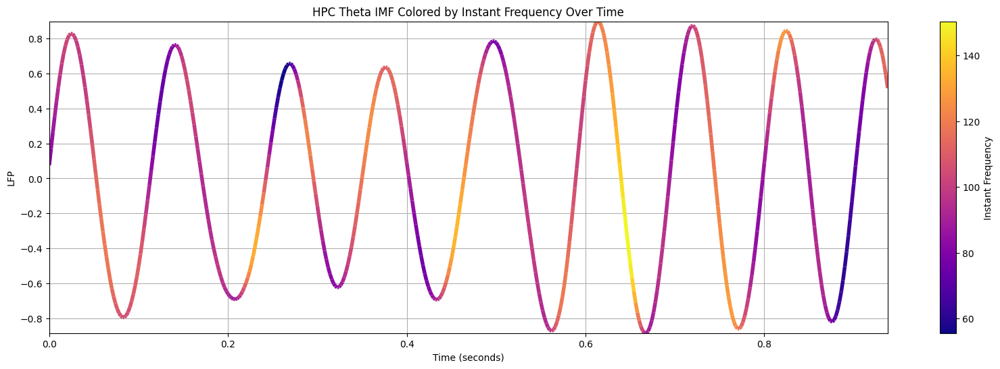

In [ ]:
time_seconds = np.arange(0, len(signal) * (1/targetFs), (1/targetFs))
plt.figure(figsize=(20, 6))
points = np.array([time_seconds, signal]).T.reshape(-1, 1, 2)
segments = np.concatenate([points[:-1], points[1:]], axis=1)
norm = plt.Normalize(signal_if.min(), signal_if.max())
cmap = plt.get_cmap('plasma')
lc = LineCollection(segments, cmap=cmap, norm=norm)
lc.set_array(signal_if)
lc.set_linewidth(4)
plt.gca().add_collection(lc)
plt.xlim(time_seconds.min(), time_seconds.max())
plt.ylim(signal.min(), signal.max())
plt.title('HPC Theta IMF Colored by Instant Frequency Over Time')
plt.xlabel('Time (seconds)')
plt.ylabel('LFP')
plt.grid(True)
cbar = plt.colorbar(lc)
cbar.set_label('Instant Frequency')

plt.show()

In [ ]:
y_nonperiodic_embedded = sliding_window_embedding_3d(signal)
pca = PCA(n_components=3)
y_nonperiodic_embedded_pca = pca.fit_transform(y_nonperiodic_embedded)
plot_point_cloud_with_features(y_nonperiodic_embedded_pca, feature_matrix=signal_if[:-2])

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



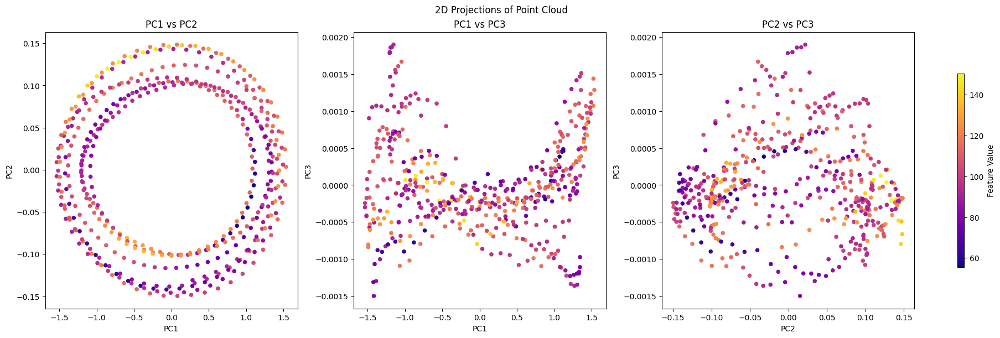

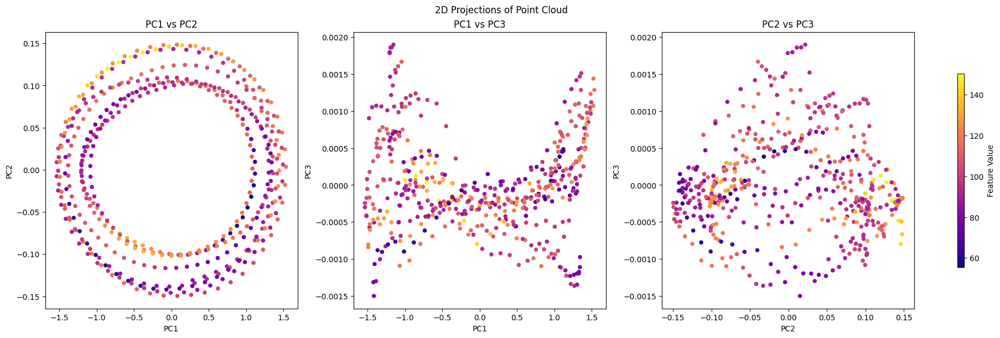

In [ ]:
plot_2d_projections(y_nonperiodic_embedded_pca, feature_matrix=signal_if[:-2])

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



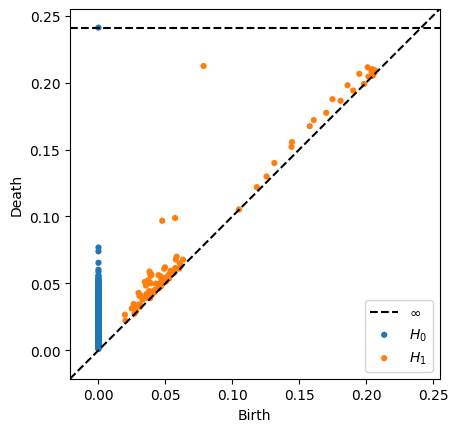

In [ ]:
dgm_p0 = ripser.ripser(y_nonperiodic_embedded)['dgms']
persim.plot_diagrams(
    dgm_p0,
    show=True
)

In [ ]:
pca2 = PCA(n_components=2)
y_nonperiodic_embedded_pca = pca2.fit_transform(y_nonperiodic_embedded)
y_nonperiodic_embeddedt = y_nonperiodic_embedded_pca[None, :, :]

from gtda.homology import VietorisRipsPersistence
# 0 - connected components, 1 - loops, 2 - voids
homology_dimensions = [0, 1]

nonperiodic_persistence = VietorisRipsPersistence(
    homology_dimensions=homology_dimensions, n_jobs=6
)
print("Persistence diagram for nonperiodic signal")
nonperiodic_persistence.fit_transform_plot(y_nonperiodic_embeddedt);

Persistence diagram for nonperiodic signal


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



# Phasic 7

In [ ]:
signal_segments = split_signal(raw_signal)
print(signal_segments.shape)
signal = signal_segments[2,:].squeeze()
signal.shape

(3, 470)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



(470,)

In [ ]:
data_if = phasic_if[7]
data_if = np.array(data_if).flatten()
downsampled_if = decimate(data_if, downsampling_factor, ftype='fir')
signals_if = split_signal(downsampled_if)
signal_if = signals_if[2,:].squeeze()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



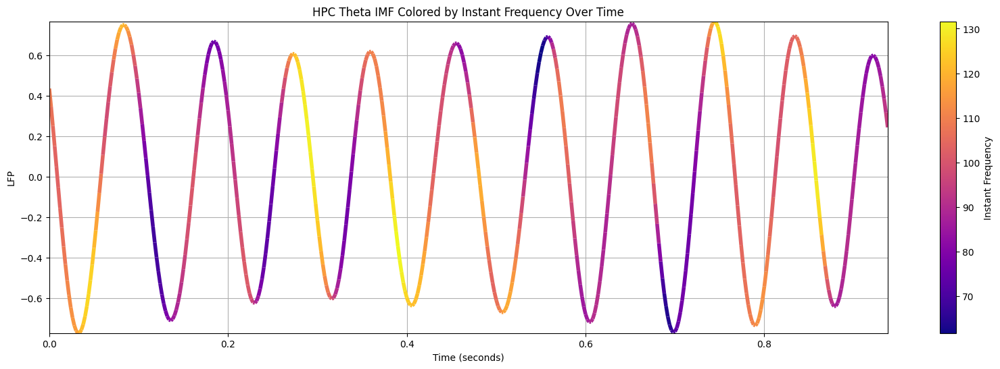

In [ ]:
time_seconds = np.arange(0, len(signal) * (1/targetFs), (1/targetFs))
plt.figure(figsize=(20, 6))
points = np.array([time_seconds, signal]).T.reshape(-1, 1, 2)
segments = np.concatenate([points[:-1], points[1:]], axis=1)
norm = plt.Normalize(signal_if.min(), signal_if.max())
cmap = plt.get_cmap('plasma')
lc = LineCollection(segments, cmap=cmap, norm=norm)
lc.set_array(signal_if)
lc.set_linewidth(4)
plt.gca().add_collection(lc)
plt.xlim(time_seconds.min(), time_seconds.max())
plt.ylim(signal.min(), signal.max())
plt.title('HPC Theta IMF Colored by Instant Frequency Over Time')
plt.xlabel('Time (seconds)')
plt.ylabel('LFP')
plt.grid(True)
cbar = plt.colorbar(lc)
cbar.set_label('Instant Frequency')

plt.show()

In [ ]:
y_nonperiodic_embedded = sliding_window_embedding_3d(signal)
pca = PCA(n_components=3)
y_nonperiodic_embedded_pca = pca.fit_transform(y_nonperiodic_embedded)
plot_point_cloud_with_features(y_nonperiodic_embedded_pca, feature_matrix=signal_if[:-2])

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



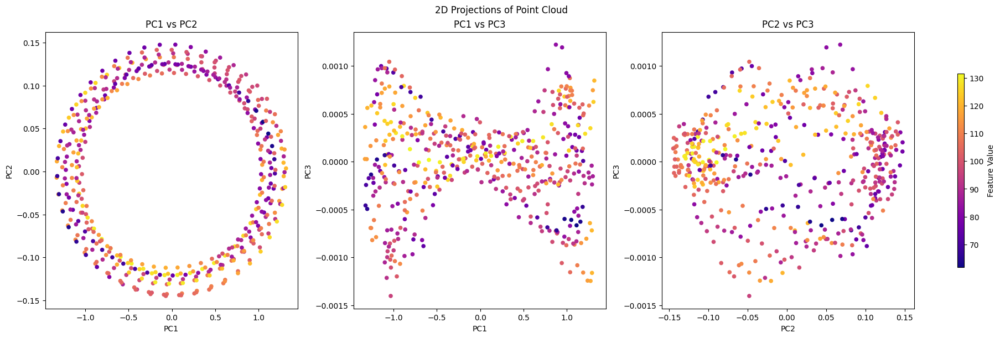

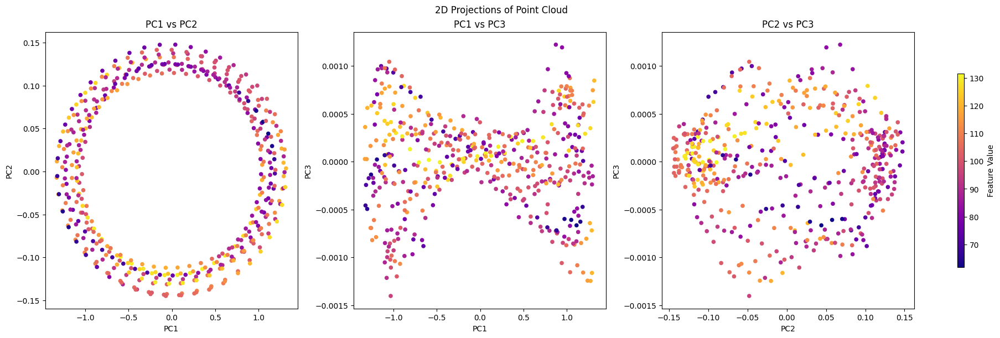

In [ ]:
plot_2d_projections(y_nonperiodic_embedded_pca, feature_matrix=signal_if[:-2])

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



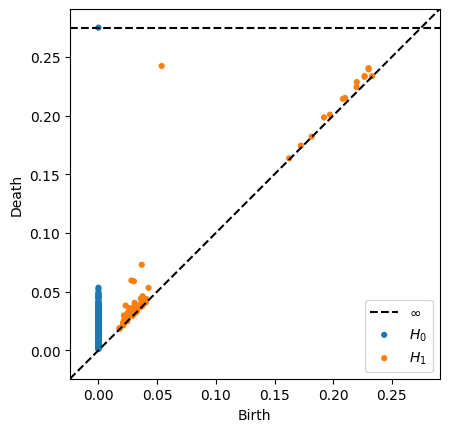

In [ ]:
dgm_p0 = ripser.ripser(y_nonperiodic_embedded)['dgms']
persim.plot_diagrams(
    dgm_p0,
    show=True
)

In [ ]:
pca2 = PCA(n_components=2)
y_nonperiodic_embedded_pca = pca2.fit_transform(y_nonperiodic_embedded)
y_nonperiodic_embeddedt = y_nonperiodic_embedded_pca[None, :, :]

from gtda.homology import VietorisRipsPersistence
# 0 - connected components, 1 - loops, 2 - voids
homology_dimensions = [0, 1]

nonperiodic_persistence = VietorisRipsPersistence(
    homology_dimensions=homology_dimensions, n_jobs=6
)
print("Persistence diagram for nonperiodic signal")
nonperiodic_persistence.fit_transform_plot(y_nonperiodic_embeddedt);

Persistence diagram for nonperiodic signal


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



# Tonic 0

In [ ]:
amp_thresh = [9,8]
time_win_thresh = [0.2,0.1]
data_HPC, artefactInds, timeValues = removeArtefacts(tonic_theta_imf[5], fs, amp_thresh, time_win_thresh)
data_HPC = zscore(data_HPC)

signal = np.array(data_HPC).flatten()
downsampled_signal = decimate(signal, downsampling_factor, ftype='fir')

raw_signal = downsampled_signal

min_val = np.min(raw_signal)
max_val = np.max(raw_signal)
raw_signal = 2 * (raw_signal - min_val) / (max_val - min_val) - 1

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
signal_segments = split_signal(raw_signal)
print(signal_segments.shape)
signal = signal_segments[0,:].squeeze()
signal.shape

(14, 470)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



(470,)

In [ ]:
data_if = tonic_if[5]
data_if = np.array(data_if).flatten()
downsampled_if = decimate(data_if, downsampling_factor, ftype='fir')
signals_if = split_signal(downsampled_if)
signal_if = signals_if[0,:].squeeze()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



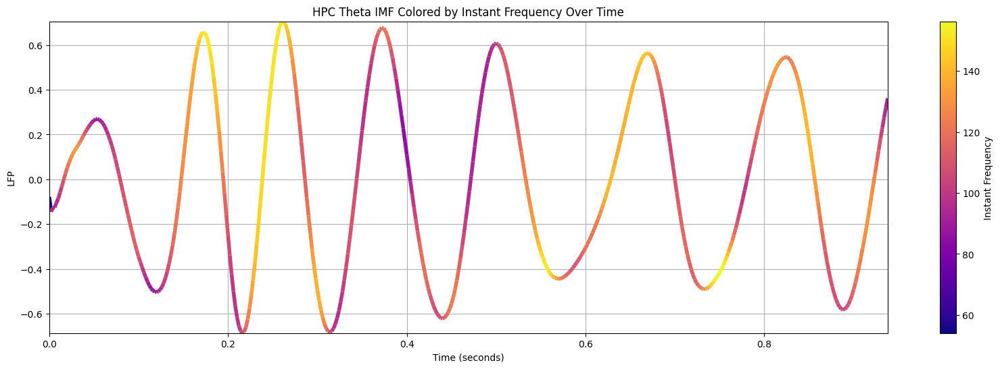

In [ ]:
time_seconds = np.arange(0, len(signal) * (1/targetFs), (1/targetFs))
plt.figure(figsize=(20, 6))
points = np.array([time_seconds, signal]).T.reshape(-1, 1, 2)
segments = np.concatenate([points[:-1], points[1:]], axis=1)
norm = plt.Normalize(signal_if.min(), signal_if.max())
cmap = plt.get_cmap('plasma')
lc = LineCollection(segments, cmap=cmap, norm=norm)
lc.set_array(signal_if)
lc.set_linewidth(4)
plt.gca().add_collection(lc)
plt.xlim(time_seconds.min(), time_seconds.max())
plt.ylim(signal.min(), signal.max())
plt.title('HPC Theta IMF Colored by Instant Frequency Over Time')
plt.xlabel('Time (seconds)')
plt.ylabel('LFP')
plt.grid(True)
cbar = plt.colorbar(lc)
cbar.set_label('Instant Frequency')

plt.show()

In [ ]:
y_nonperiodic_embedded = sliding_window_embedding_3d(signal)
pca = PCA(n_components=3)
y_nonperiodic_embedded_pca = pca.fit_transform(y_nonperiodic_embedded)
plot_point_cloud_with_features(y_nonperiodic_embedded_pca, feature_matrix=signal_if[:-2])

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



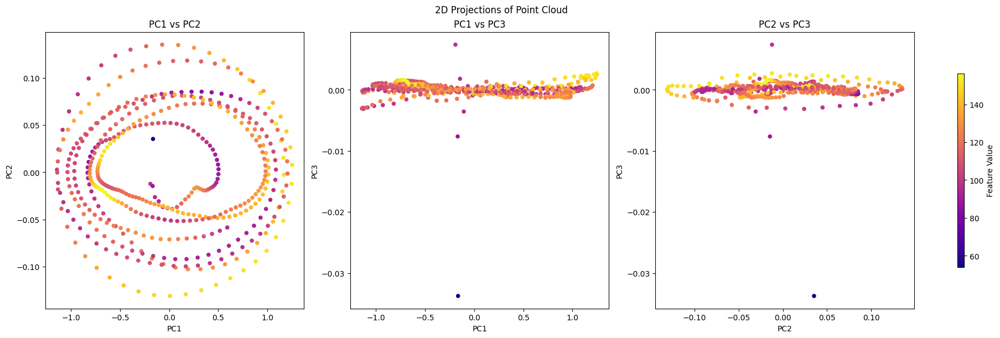

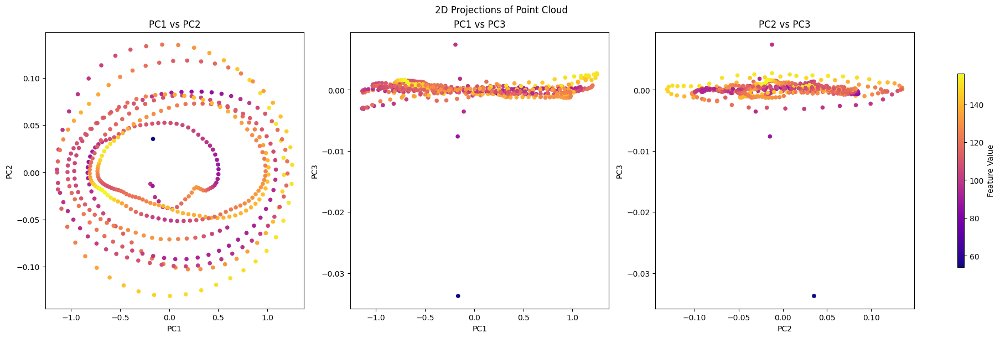

In [ ]:
plot_2d_projections(y_nonperiodic_embedded_pca, feature_matrix=signal_if[:-2])

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



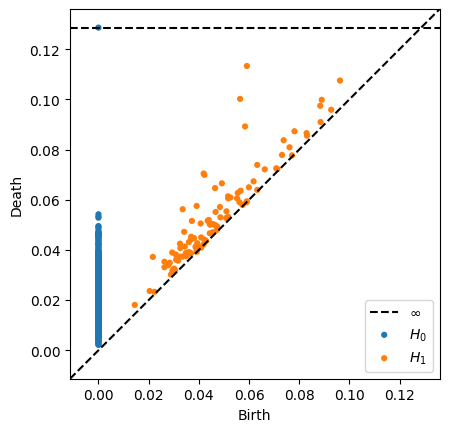

In [ ]:
dgm_t0 = ripser.ripser(y_nonperiodic_embedded)['dgms']
persim.plot_diagrams(
    dgm_t0,
    show=True
)

In [ ]:
pca2 = PCA(n_components=2)
y_nonperiodic_embedded_pca = pca2.fit_transform(y_nonperiodic_embedded)
y_nonperiodic_embeddedt = y_nonperiodic_embedded_pca[None, :, :]

from gtda.homology import VietorisRipsPersistence
# 0 - connected components, 1 - loops, 2 - voids
homology_dimensions = [0, 1]

nonperiodic_persistence = VietorisRipsPersistence(
    homology_dimensions=homology_dimensions, n_jobs=6
)
print("Persistence diagram for nonperiodic signal")
nonperiodic_persistence.fit_transform_plot(y_nonperiodic_embeddedt);

Persistence diagram for nonperiodic signal


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



# Tonic 1

In [ ]:
signal_segments = split_signal(raw_signal)
print(signal_segments.shape)
signal = signal_segments[1,:].squeeze()
signal.shape

(14, 470)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



(470,)

In [ ]:
data_if = tonic_if[5]
data_if = np.array(data_if).flatten()
downsampled_if = decimate(data_if, downsampling_factor, ftype='fir')
signals_if = split_signal(downsampled_if)
signal_if = signals_if[1,:].squeeze()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



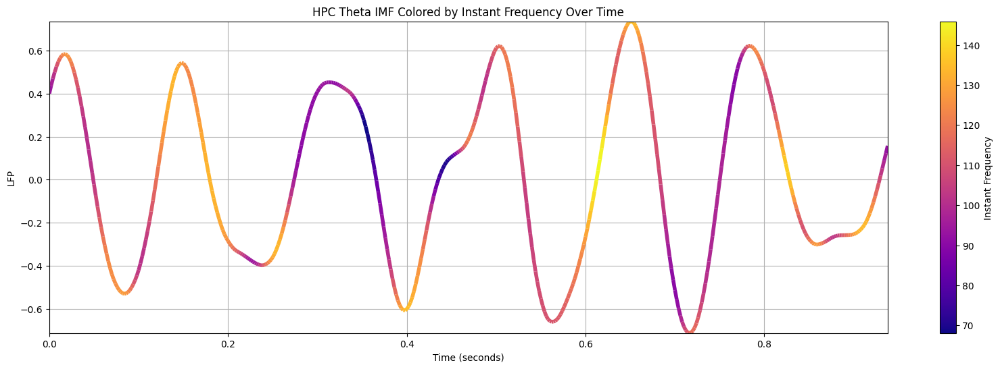

In [ ]:
time_seconds = np.arange(0, len(signal) * (1/targetFs), (1/targetFs))
plt.figure(figsize=(20, 6))
points = np.array([time_seconds, signal]).T.reshape(-1, 1, 2)
segments = np.concatenate([points[:-1], points[1:]], axis=1)
norm = plt.Normalize(signal_if.min(), signal_if.max())
cmap = plt.get_cmap('plasma')
lc = LineCollection(segments, cmap=cmap, norm=norm)
lc.set_array(signal_if)
lc.set_linewidth(4)
plt.gca().add_collection(lc)
plt.xlim(time_seconds.min(), time_seconds.max())
plt.ylim(signal.min(), signal.max())
plt.title('HPC Theta IMF Colored by Instant Frequency Over Time')
plt.xlabel('Time (seconds)')
plt.ylabel('LFP')
plt.grid(True)
cbar = plt.colorbar(lc)
cbar.set_label('Instant Frequency')

plt.show()

In [ ]:
y_nonperiodic_embedded = sliding_window_embedding_3d(signal)
pca = PCA(n_components=3)
y_nonperiodic_embedded_pca = pca.fit_transform(y_nonperiodic_embedded)
plot_point_cloud_with_features(y_nonperiodic_embedded_pca, feature_matrix=signal_if[:-2])

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



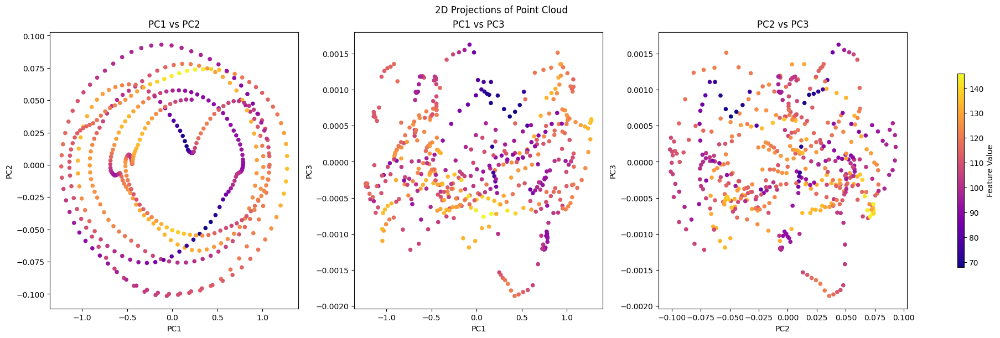

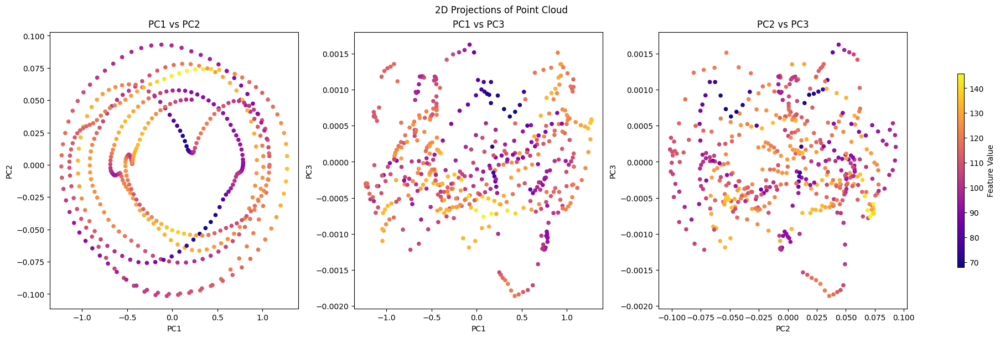

In [ ]:
plot_2d_projections(y_nonperiodic_embedded_pca, feature_matrix=signal_if[:-2])

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



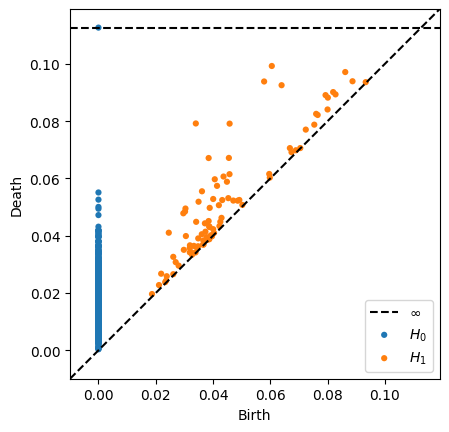

In [ ]:
dgm_t0 = ripser.ripser(y_nonperiodic_embedded)['dgms']
persim.plot_diagrams(
    dgm_t0,
    show=True
)

In [ ]:
pca2 = PCA(n_components=2)
y_nonperiodic_embedded_pca = pca2.fit_transform(y_nonperiodic_embedded)
y_nonperiodic_embeddedt = y_nonperiodic_embedded_pca[None, :, :]

from gtda.homology import VietorisRipsPersistence
# 0 - connected components, 1 - loops, 2 - voids
homology_dimensions = [0, 1]

nonperiodic_persistence = VietorisRipsPersistence(
    homology_dimensions=homology_dimensions, n_jobs=6
)
print("Persistence diagram for nonperiodic signal")
nonperiodic_persistence.fit_transform_plot(y_nonperiodic_embeddedt);

Persistence diagram for nonperiodic signal


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



# Tonic 2

In [ ]:
signal_segments = split_signal(raw_signal)
print(signal_segments.shape)
signal = signal_segments[2,:].squeeze()
signal.shape

(14, 470)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



(470,)

In [ ]:
data_if = tonic_if[5]
data_if = np.array(data_if).flatten()
downsampled_if = decimate(data_if, downsampling_factor, ftype='fir')
signals_if = split_signal(downsampled_if)
signal_if = signals_if[2,:].squeeze()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



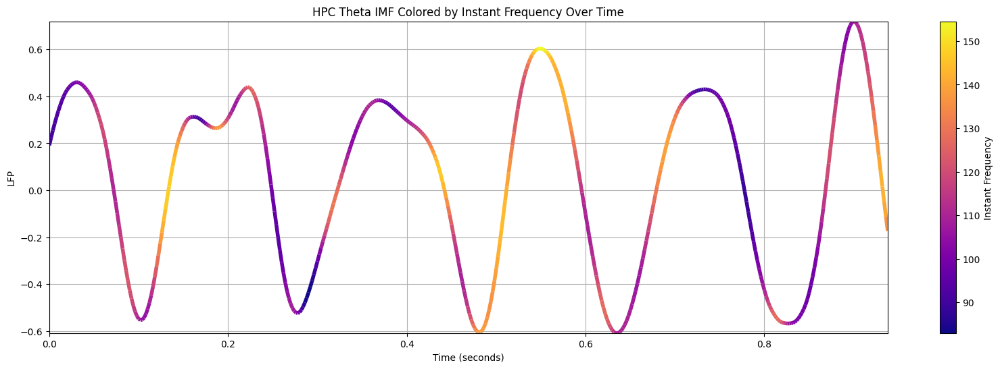

In [ ]:
time_seconds = np.arange(0, len(signal) * (1/targetFs), (1/targetFs))
plt.figure(figsize=(20, 6))
points = np.array([time_seconds, signal]).T.reshape(-1, 1, 2)
segments = np.concatenate([points[:-1], points[1:]], axis=1)
norm = plt.Normalize(signal_if.min(), signal_if.max())
cmap = plt.get_cmap('plasma')
lc = LineCollection(segments, cmap=cmap, norm=norm)
lc.set_array(signal_if)
lc.set_linewidth(4)
plt.gca().add_collection(lc)
plt.xlim(time_seconds.min(), time_seconds.max())
plt.ylim(signal.min(), signal.max())
plt.title('HPC Theta IMF Colored by Instant Frequency Over Time')
plt.xlabel('Time (seconds)')
plt.ylabel('LFP')
plt.grid(True)
cbar = plt.colorbar(lc)
cbar.set_label('Instant Frequency')

plt.show()

In [ ]:
y_nonperiodic_embedded = sliding_window_embedding_3d(signal)
pca = PCA(n_components=3)
y_nonperiodic_embedded_pca = pca.fit_transform(y_nonperiodic_embedded)
plot_point_cloud_with_features(y_nonperiodic_embedded_pca, feature_matrix=signal_if[:-2])

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



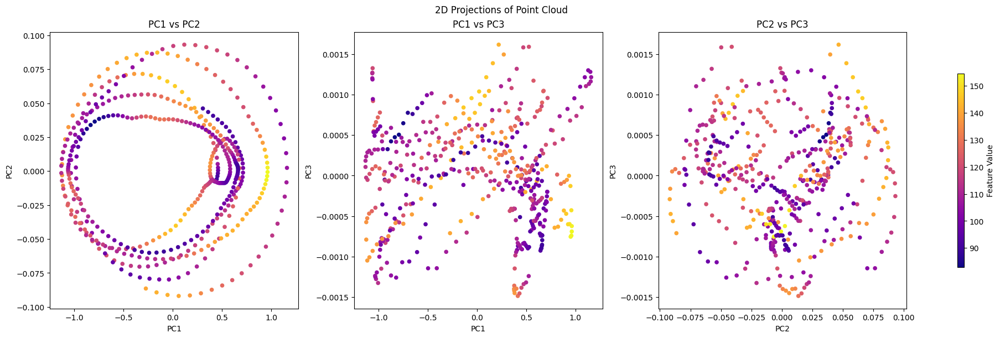

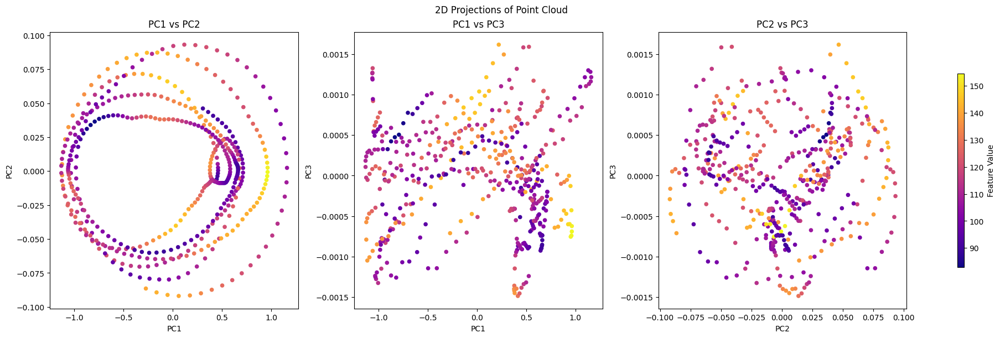

In [ ]:
plot_2d_projections(y_nonperiodic_embedded_pca, feature_matrix=signal_if[:-2])

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



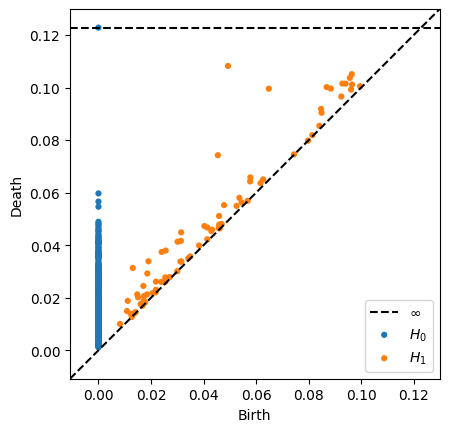

In [ ]:
dgm_t0 = ripser.ripser(y_nonperiodic_embedded)['dgms']
persim.plot_diagrams(
    dgm_t0,
    show=True
)

In [ ]:
pca2 = PCA(n_components=2)
y_nonperiodic_embedded_pca = pca2.fit_transform(y_nonperiodic_embedded)
y_nonperiodic_embeddedt = y_nonperiodic_embedded_pca[None, :, :]

from gtda.homology import VietorisRipsPersistence
# 0 - connected components, 1 - loops, 2 - voids
homology_dimensions = [0, 1]

nonperiodic_persistence = VietorisRipsPersistence(
    homology_dimensions=homology_dimensions, n_jobs=6
)
print("Persistence diagram for nonperiodic signal")
nonperiodic_persistence.fit_transform_plot(y_nonperiodic_embeddedt);

Persistence diagram for nonperiodic signal


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



# Tonic 3

In [ ]:
signal_segments = split_signal(raw_signal)
print(signal_segments.shape)
signal = signal_segments[3,:].squeeze()
signal.shape

(14, 470)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



(470,)

In [ ]:
data_if = tonic_if[5]
data_if = np.array(data_if).flatten()
downsampled_if = decimate(data_if, downsampling_factor, ftype='fir')
signals_if = split_signal(downsampled_if)
signal_if = signals_if[3,:].squeeze()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



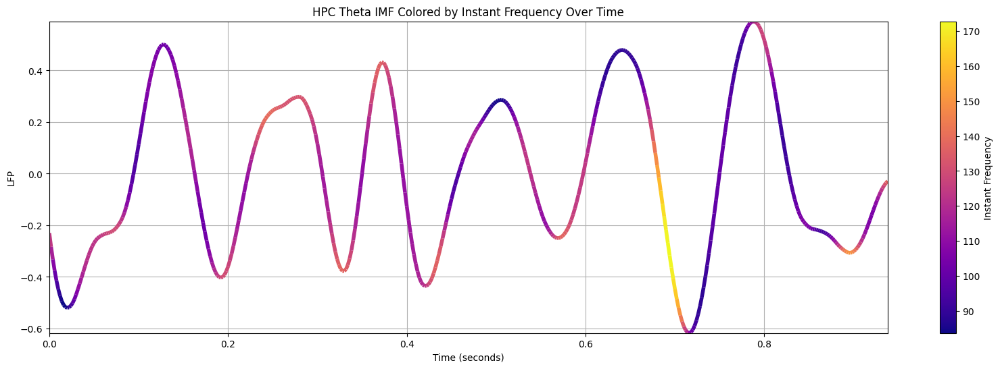

In [ ]:
time_seconds = np.arange(0, len(signal) * (1/targetFs), (1/targetFs))
plt.figure(figsize=(20, 6))
points = np.array([time_seconds, signal]).T.reshape(-1, 1, 2)
segments = np.concatenate([points[:-1], points[1:]], axis=1)
norm = plt.Normalize(signal_if.min(), signal_if.max())
cmap = plt.get_cmap('plasma')
lc = LineCollection(segments, cmap=cmap, norm=norm)
lc.set_array(signal_if)
lc.set_linewidth(4)
plt.gca().add_collection(lc)
plt.xlim(time_seconds.min(), time_seconds.max())
plt.ylim(signal.min(), signal.max())
plt.title('HPC Theta IMF Colored by Instant Frequency Over Time')
plt.xlabel('Time (seconds)')
plt.ylabel('LFP')
plt.grid(True)
cbar = plt.colorbar(lc)
cbar.set_label('Instant Frequency')

plt.show()

In [ ]:
y_nonperiodic_embedded = sliding_window_embedding_3d(signal)
pca = PCA(n_components=3)
y_nonperiodic_embedded_pca = pca.fit_transform(y_nonperiodic_embedded)
plot_point_cloud_with_features(y_nonperiodic_embedded_pca, feature_matrix=signal_if[:-2])

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



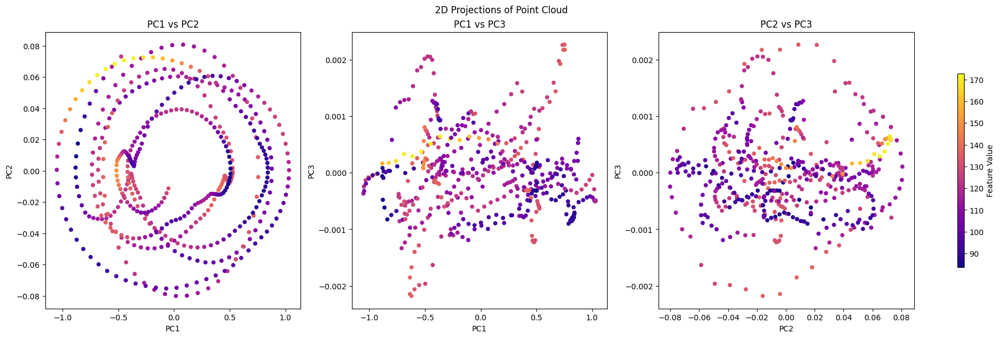

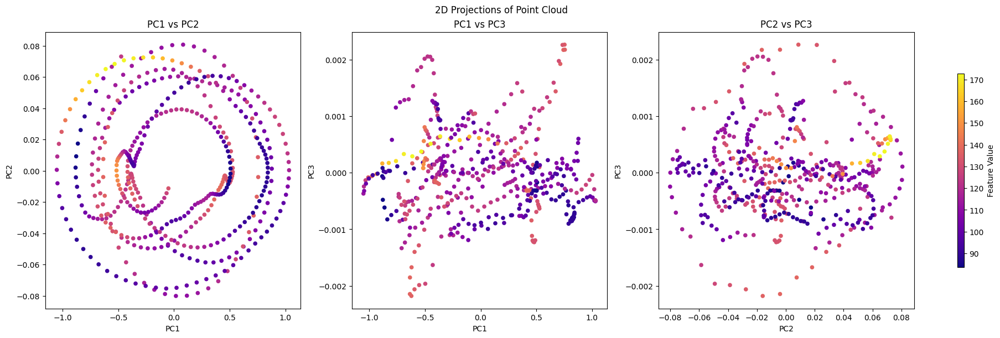

In [ ]:
plot_2d_projections(y_nonperiodic_embedded_pca, feature_matrix=signal_if[:-2])

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



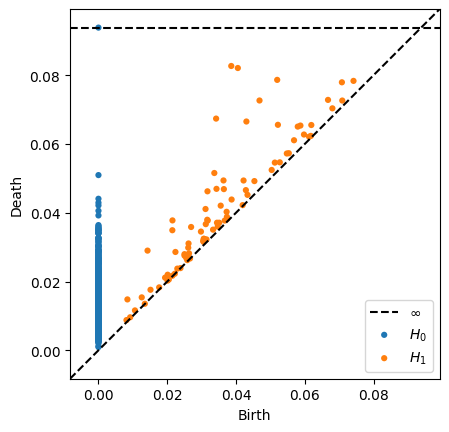

In [ ]:
dgm_t0 = ripser.ripser(y_nonperiodic_embedded)['dgms']
persim.plot_diagrams(
    dgm_t0,
    show=True
)

In [ ]:
pca2 = PCA(n_components=2)
y_nonperiodic_embedded_pca = pca2.fit_transform(y_nonperiodic_embedded)
y_nonperiodic_embeddedt = y_nonperiodic_embedded_pca[None, :, :]

from gtda.homology import VietorisRipsPersistence
# 0 - connected components, 1 - loops, 2 - voids
homology_dimensions = [0, 1]

nonperiodic_persistence = VietorisRipsPersistence(
    homology_dimensions=homology_dimensions, n_jobs=6
)
print("Persistence diagram for nonperiodic signal")
nonperiodic_persistence.fit_transform_plot(y_nonperiodic_embeddedt);

Persistence diagram for nonperiodic signal


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



# Tonic 4

In [ ]:
signal_segments = split_signal(raw_signal)
print(signal_segments.shape)
signal = signal_segments[4,:].squeeze()
signal.shape

(14, 470)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



(470,)

In [ ]:
data_if = tonic_if[5]
data_if = np.array(data_if).flatten()
downsampled_if = decimate(data_if, downsampling_factor, ftype='fir')
signals_if = split_signal(downsampled_if)
signal_if = signals_if[4,:].squeeze()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



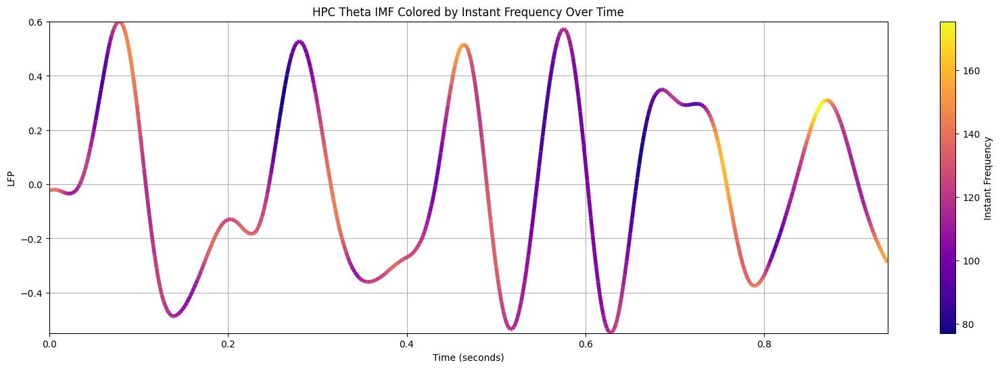

In [ ]:
time_seconds = np.arange(0, len(signal) * (1/targetFs), (1/targetFs))
plt.figure(figsize=(20, 6))
points = np.array([time_seconds, signal]).T.reshape(-1, 1, 2)
segments = np.concatenate([points[:-1], points[1:]], axis=1)
norm = plt.Normalize(signal_if.min(), signal_if.max())
cmap = plt.get_cmap('plasma')
lc = LineCollection(segments, cmap=cmap, norm=norm)
lc.set_array(signal_if)
lc.set_linewidth(4)
plt.gca().add_collection(lc)
plt.xlim(time_seconds.min(), time_seconds.max())
plt.ylim(signal.min(), signal.max())
plt.title('HPC Theta IMF Colored by Instant Frequency Over Time')
plt.xlabel('Time (seconds)')
plt.ylabel('LFP')
plt.grid(True)
cbar = plt.colorbar(lc)
cbar.set_label('Instant Frequency')

plt.show()

In [ ]:
y_nonperiodic_embedded = sliding_window_embedding_3d(signal)
pca = PCA(n_components=3)
y_nonperiodic_embedded_pca = pca.fit_transform(y_nonperiodic_embedded)
plot_point_cloud_with_features(y_nonperiodic_embedded_pca, feature_matrix=signal_if[:-2])

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



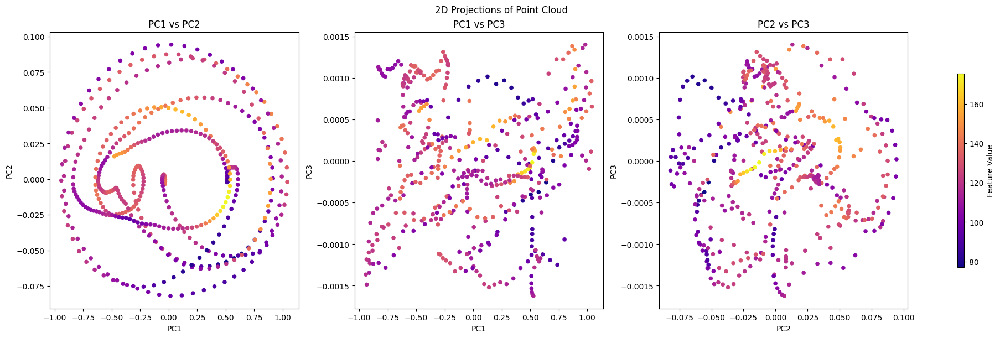

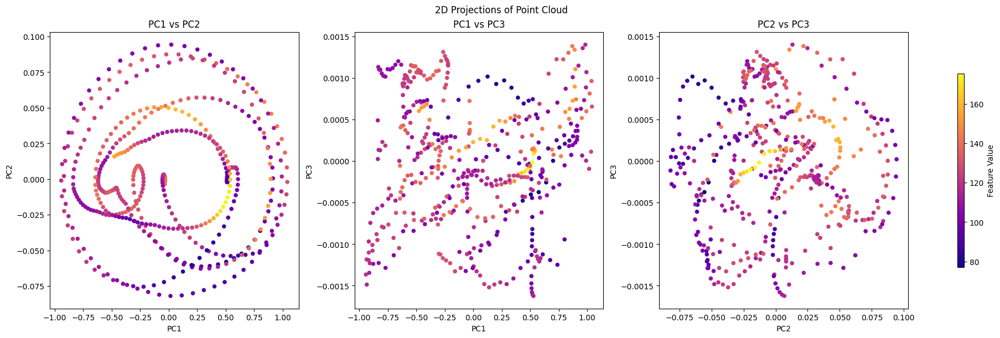

In [ ]:
plot_2d_projections(y_nonperiodic_embedded_pca, feature_matrix=signal_if[:-2])

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



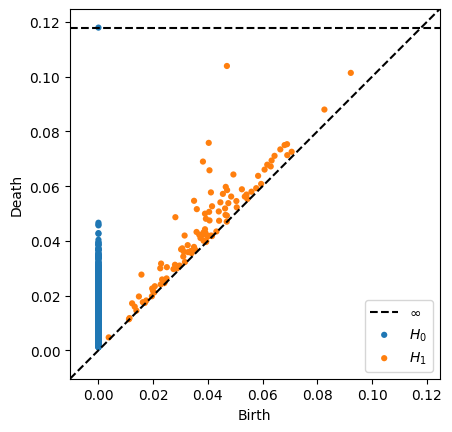

In [ ]:
dgm_t0 = ripser.ripser(y_nonperiodic_embedded)['dgms']
persim.plot_diagrams(
    dgm_t0,
    show=True
)

In [ ]:
pca2 = PCA(n_components=2)
y_nonperiodic_embedded_pca = pca2.fit_transform(y_nonperiodic_embedded)
y_nonperiodic_embeddedt = y_nonperiodic_embedded_pca[None, :, :]

from gtda.homology import VietorisRipsPersistence
# 0 - connected components, 1 - loops, 2 - voids
homology_dimensions = [0, 1]

nonperiodic_persistence = VietorisRipsPersistence(
    homology_dimensions=homology_dimensions, n_jobs=6
)
print("Persistence diagram for nonperiodic signal")
nonperiodic_persistence.fit_transform_plot(y_nonperiodic_embeddedt);

Persistence diagram for nonperiodic signal


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



# Tonic 5

In [ ]:
signal_segments = split_signal(raw_signal)
print(signal_segments.shape)
signal = signal_segments[5,:].squeeze()
signal.shape

(14, 470)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



(470,)

In [ ]:
data_if = tonic_if[5]
data_if = np.array(data_if).flatten()
downsampled_if = decimate(data_if, downsampling_factor, ftype='fir')
signals_if = split_signal(downsampled_if)
signal_if = signals_if[5,:].squeeze()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



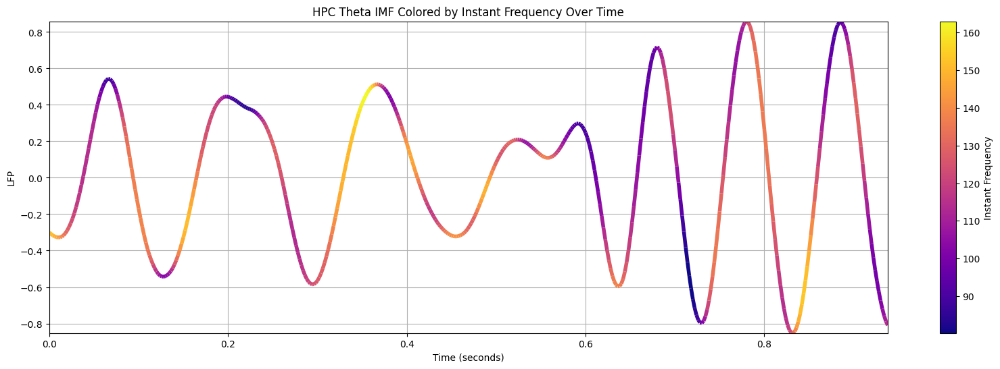

In [ ]:
time_seconds = np.arange(0, len(signal) * (1/targetFs), (1/targetFs))
plt.figure(figsize=(20, 6))
points = np.array([time_seconds, signal]).T.reshape(-1, 1, 2)
segments = np.concatenate([points[:-1], points[1:]], axis=1)
norm = plt.Normalize(signal_if.min(), signal_if.max())
cmap = plt.get_cmap('plasma')
lc = LineCollection(segments, cmap=cmap, norm=norm)
lc.set_array(signal_if)
lc.set_linewidth(4)
plt.gca().add_collection(lc)
plt.xlim(time_seconds.min(), time_seconds.max())
plt.ylim(signal.min(), signal.max())
plt.title('HPC Theta IMF Colored by Instant Frequency Over Time')
plt.xlabel('Time (seconds)')
plt.ylabel('LFP')
plt.grid(True)
cbar = plt.colorbar(lc)
cbar.set_label('Instant Frequency')

plt.show()

In [ ]:
y_nonperiodic_embedded = sliding_window_embedding_3d(signal)
pca = PCA(n_components=3)
y_nonperiodic_embedded_pca = pca.fit_transform(y_nonperiodic_embedded)
plot_point_cloud_with_features(y_nonperiodic_embedded_pca, feature_matrix=signal_if[:-2])

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



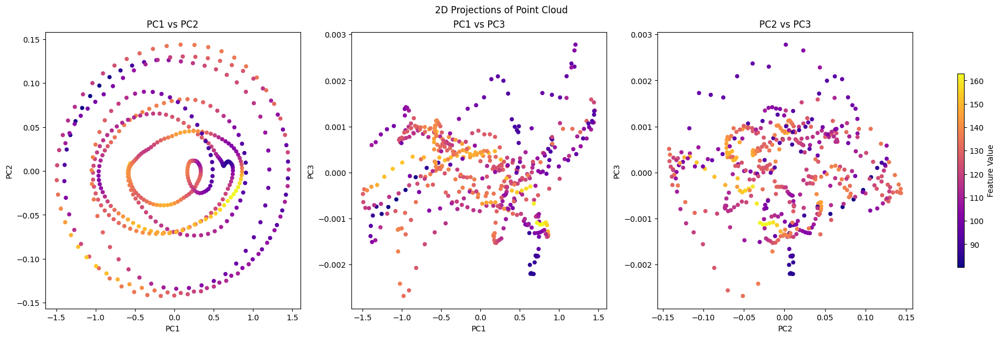

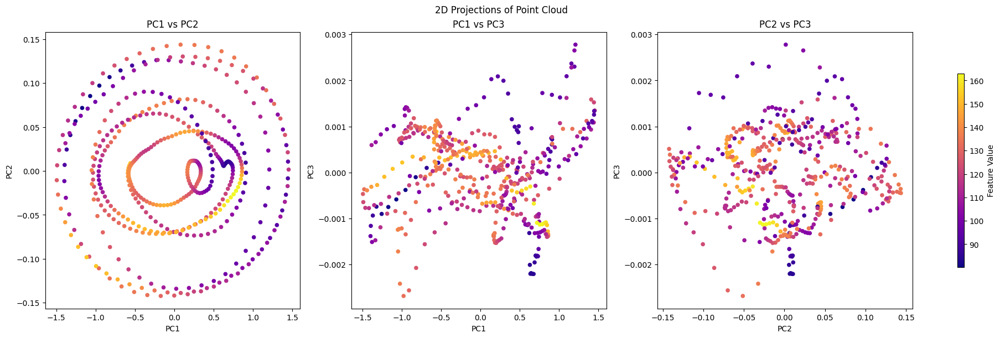

In [ ]:
plot_2d_projections(y_nonperiodic_embedded_pca, feature_matrix=signal_if[:-2])

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



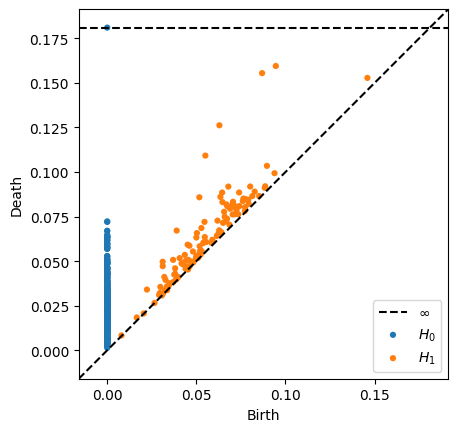

In [ ]:
dgm_t0 = ripser.ripser(y_nonperiodic_embedded)['dgms']
persim.plot_diagrams(
    dgm_t0,
    show=True
)

In [ ]:
pca2 = PCA(n_components=2)
y_nonperiodic_embedded_pca = pca2.fit_transform(y_nonperiodic_embedded)
y_nonperiodic_embeddedt = y_nonperiodic_embedded_pca[None, :, :]

from gtda.homology import VietorisRipsPersistence
# 0 - connected components, 1 - loops, 2 - voids
homology_dimensions = [0, 1]

nonperiodic_persistence = VietorisRipsPersistence(
    homology_dimensions=homology_dimensions, n_jobs=6
)
print("Persistence diagram for nonperiodic signal")
nonperiodic_persistence.fit_transform_plot(y_nonperiodic_embeddedt);

Persistence diagram for nonperiodic signal


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



# Tonic 6

In [ ]:
signal_segments = split_signal(raw_signal)
print(signal_segments.shape)
signal = signal_segments[6,:].squeeze()
signal.shape

(14, 470)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



(470,)

In [ ]:
data_if = tonic_if[5]
data_if = np.array(data_if).flatten()
downsampled_if = decimate(data_if, downsampling_factor, ftype='fir')
signals_if = split_signal(downsampled_if)
signal_if = signals_if[6,:].squeeze()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



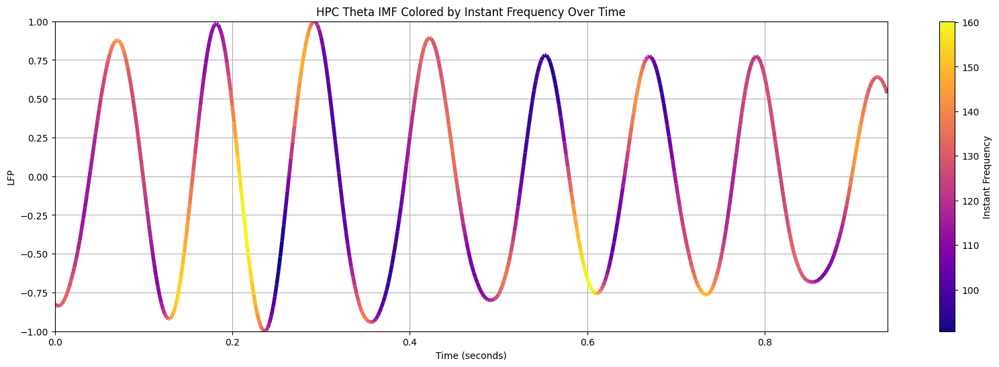

In [ ]:
time_seconds = np.arange(0, len(signal) * (1/targetFs), (1/targetFs))
plt.figure(figsize=(20, 6))
points = np.array([time_seconds, signal]).T.reshape(-1, 1, 2)
segments = np.concatenate([points[:-1], points[1:]], axis=1)
norm = plt.Normalize(signal_if.min(), signal_if.max())
cmap = plt.get_cmap('plasma')
lc = LineCollection(segments, cmap=cmap, norm=norm)
lc.set_array(signal_if)
lc.set_linewidth(4)
plt.gca().add_collection(lc)
plt.xlim(time_seconds.min(), time_seconds.max())
plt.ylim(signal.min(), signal.max())
plt.title('HPC Theta IMF Colored by Instant Frequency Over Time')
plt.xlabel('Time (seconds)')
plt.ylabel('LFP')
plt.grid(True)
cbar = plt.colorbar(lc)
cbar.set_label('Instant Frequency')

plt.show()

In [ ]:
y_nonperiodic_embedded = sliding_window_embedding_3d(signal)
pca = PCA(n_components=3)
y_nonperiodic_embedded_pca = pca.fit_transform(y_nonperiodic_embedded)
plot_point_cloud_with_features(y_nonperiodic_embedded_pca, feature_matrix=signal_if[:-2])

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



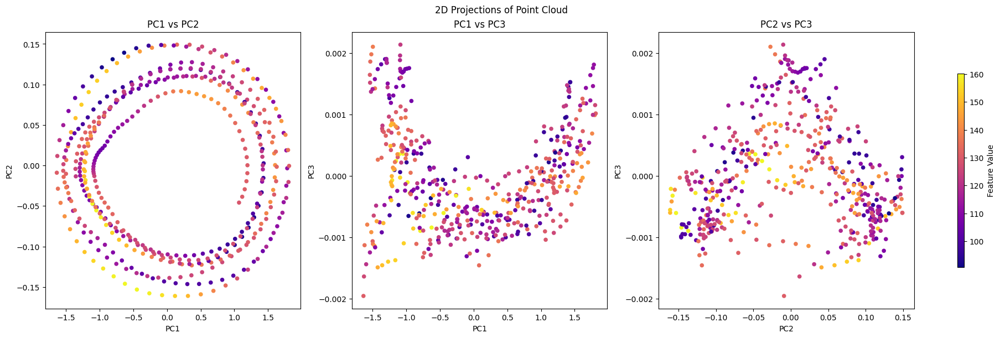

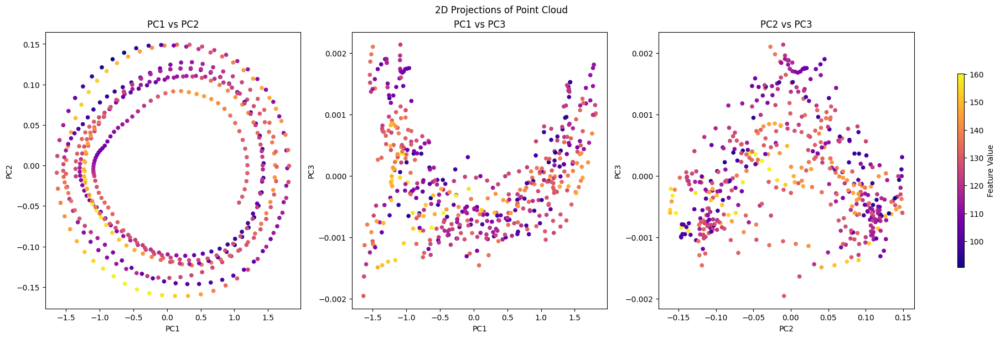

In [ ]:
plot_2d_projections(y_nonperiodic_embedded_pca, feature_matrix=signal_if[:-2])

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



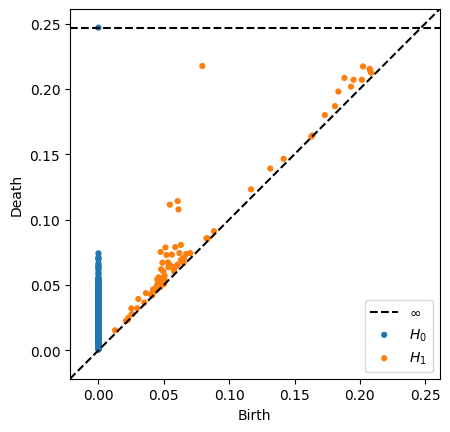

In [ ]:
dgm_t0 = ripser.ripser(y_nonperiodic_embedded)['dgms']
persim.plot_diagrams(
    dgm_t0,
    show=True
)

In [ ]:
pca2 = PCA(n_components=2)
y_nonperiodic_embedded_pca = pca2.fit_transform(y_nonperiodic_embedded)
y_nonperiodic_embeddedt = y_nonperiodic_embedded_pca[None, :, :]

from gtda.homology import VietorisRipsPersistence
# 0 - connected components, 1 - loops, 2 - voids
homology_dimensions = [0, 1]

nonperiodic_persistence = VietorisRipsPersistence(
    homology_dimensions=homology_dimensions, n_jobs=6
)
print("Persistence diagram for nonperiodic signal")
nonperiodic_persistence.fit_transform_plot(y_nonperiodic_embeddedt);

Persistence diagram for nonperiodic signal


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



# Tonic 7

In [ ]:
signal_segments = split_signal(raw_signal)
print(signal_segments.shape)
signal = signal_segments[7,:].squeeze()
signal.shape

(14, 470)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



(470,)

In [ ]:
data_if = tonic_if[5]
data_if = np.array(data_if).flatten()
downsampled_if = decimate(data_if, downsampling_factor, ftype='fir')
signals_if = split_signal(downsampled_if)
signal_if = signals_if[7,:].squeeze()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
negative_count = np.sum(signal_if < 0)
negative_count

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



0

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



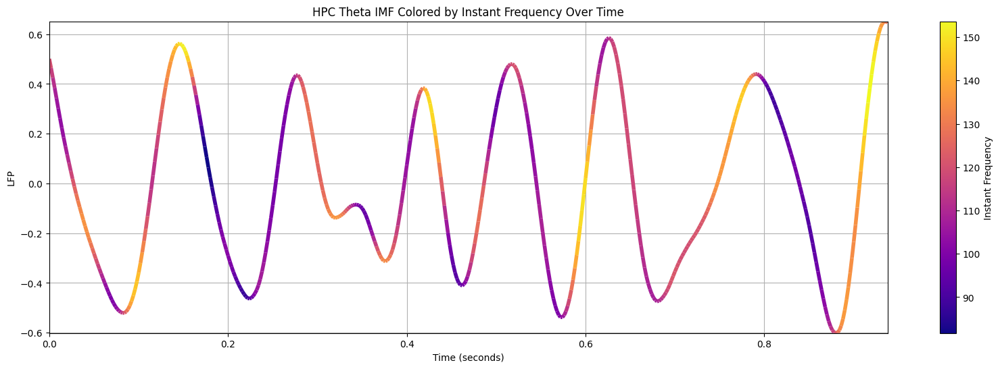

In [ ]:
time_seconds = np.arange(0, len(signal) * (1/targetFs), (1/targetFs))
plt.figure(figsize=(20, 6))
points = np.array([time_seconds, signal]).T.reshape(-1, 1, 2)
segments = np.concatenate([points[:-1], points[1:]], axis=1)
norm = plt.Normalize(signal_if.min(), signal_if.max())
cmap = plt.get_cmap('plasma')
lc = LineCollection(segments, cmap=cmap, norm=norm)
lc.set_array(signal_if)
lc.set_linewidth(4)
plt.gca().add_collection(lc)
plt.xlim(time_seconds.min(), time_seconds.max())
plt.ylim(signal.min(), signal.max())
plt.title('HPC Theta IMF Colored by Instant Frequency Over Time')
plt.xlabel('Time (seconds)')
plt.ylabel('LFP')
plt.grid(True)
cbar = plt.colorbar(lc)
cbar.set_label('Instant Frequency')

plt.show()

In [ ]:
roy_nonperiodic_embedded = sliding_window_embedding_3d(signal)
pca = PCA(n_components=3)
y_nonperiodic_embedded_pca = pca.fit_transform(y_nonperiodic_embedded)
plot_point_cloud_with_features(y_nonperiodic_embedded_pca, feature_matrix=signal_if[:-2])

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



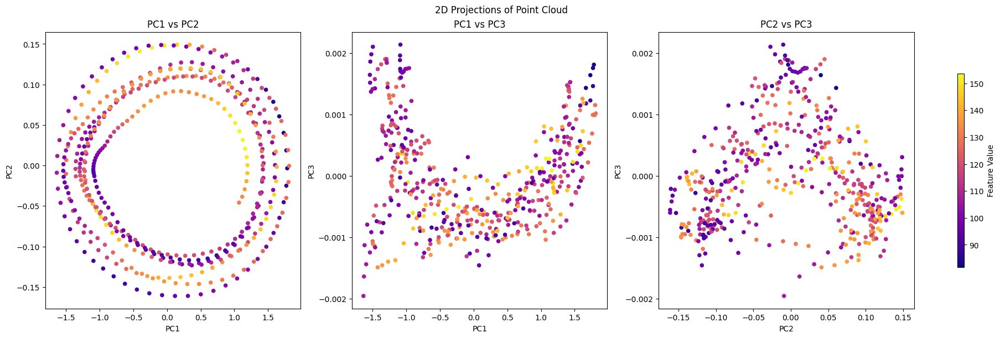

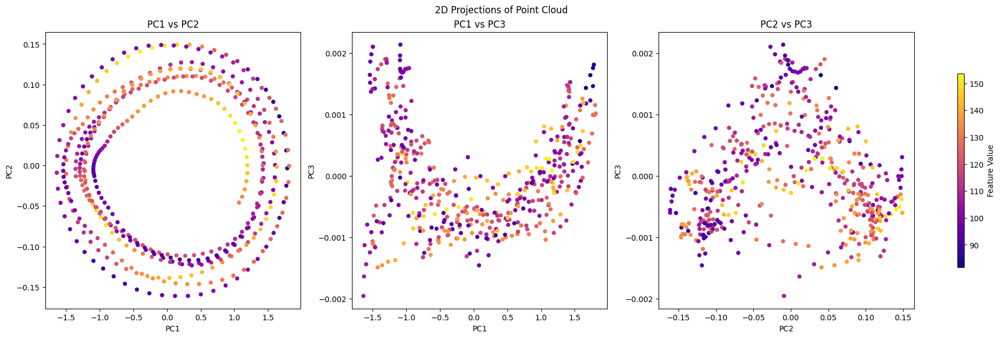

In [ ]:
plot_2d_projections(y_nonperiodic_embedded_pca, feature_matrix=signal_if[:-2])

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



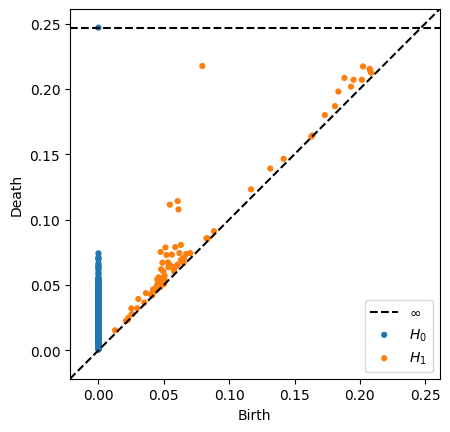

In [ ]:
dgm_t0 = ripser.ripser(y_nonperiodic_embedded)['dgms']
persim.plot_diagrams(
    dgm_t0,
    show=True
)

In [ ]:
pca2 = PCA(n_components=2)
y_nonperiodic_embedded_pca = pca2.fit_transform(y_nonperiodic_embedded)
y_nonperiodic_embeddedt = y_nonperiodic_embedded_pca[None, :, :]

from gtda.homology import VietorisRipsPersistence
# 0 - connected components, 1 - loops, 2 - voids
homology_dimensions = [0, 1]

nonperiodic_persistence = VietorisRipsPersistence(
    homology_dimensions=homology_dimensions, n_jobs=6
)
print("Persistence diagram for nonperiodic signal")
nonperiodic_persistence.fit_transform_plot(y_nonperiodic_embeddedt);

Persistence diagram for nonperiodic signal


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.

